## 03 - Evaluate HPCS-derived traced cells
Combine data from IGO15600, IGO15601, IGO15771, and IGO15488(1_2) to evaluate HPCS-derived cells

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
from joblib import dump, load

import math
import matplotlib
from matplotlib import pyplot as plt

from pathlib import Path
import anndata

In [2]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "Arial"
#plt.rcParams['figure.figsize'] = (3,4)

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
np.random.seed(1573)   #fix so we can reproduce later

In [4]:
Path("./figures").mkdir(parents=True, exist_ok=True) # generate figures here
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

## Define scoring Functions

In [5]:
# Score Cluster 5 cells
import csv
clusters = {}
clusterkeys = []
HPCS = False

def resetClusters(hpcs = 'cell2020'):
    clusters = {}
    clusterkeys = []
    HPCS = False
    try:
        if hpcs == 'cell2020':         
            with open('../common_files/clusters_cell2020.csv',encoding='utf-8-sig') as csvfile:
                csvreader = csv.reader(csvfile, delimiter=",")
                for row in csvreader:
                    clusters[row[0]] = [x for x in row[1:] if x != '']
            for i in range(1,13):
                #if i == 9: continue
                clusterkeys.append('Cluster %i' % i)
            HPCS = 'Cluster 5'
        else:
            raise ValueError
    except ValueError:
        print("%s is an invalid choice" % hpcs)
        raise
    return (clusters, clusterkeys, HPCS)

(clusters, clusterkeys, HPCS) = resetClusters('cell2020')

In [6]:
(clusters, clusterkeys, HPCS) = resetClusters('cell2020')

In [7]:
def scoreAndPlot(ad, excludeList = None, groupby="Classification",rotation=90,numgenes=25,ctlgenes=25):
    #cmap = 'Reds' #colormap
    cmap = 'jet' #colormap
    if excludeList == None:
        for i in clusterkeys:
            if (numgenes > ctlgenes):
                ctlgenes = numgenes
            sc.tl.score_genes(ad, clusters[i][0:numgenes],score_name="%s" % i, ctrl_size=ctlgenes)
  
        sc.pl.umap(ad, color=clusterkeys, color_map=cmap)
        sc.pl.dotplot(ad, clusterkeys, groupby=groupby, swap_axes=True)

In [8]:
from scipy.stats import ranksums

def HPCSViolinPlot(ad, cluster='0', groupby='leiden', score='Cluster5', save=None, singleGene=False):
    ad.obs['Cl5'] = 'not HPCS'
    ad.obs.loc[ad.obs[groupby].isin([cluster]), 'Cl5'] = 'HPCS'

    if singleGene:
        pvalue = ranksums(ad[ad.obs['Cl5'].isin(['HPCS'])][:,score].X.toarray(),ad[~ad.obs['Cl5'].isin(['HPCS'])][:,score].X.toarray())[1]
    else:
        pvalue = ranksums(ad[ad.obs['Cl5'].isin(['HPCS'])].obs[score],ad[ad.obs['Cl5'].isin(['not HPCS'])].obs[score])[1]
    sc.pl.violin(ad, score, groupby='Cl5', xlabel = 'p = ' + str(pvalue), save=save)

## Define cells to be only traced cells for PV calculation

In [9]:
adata = anndata.read_h5ad('write/combined_data.h5ad')

In [10]:
#Ensure PV is using only same variables across all cells and batches
non_zero_vars = adata.var_names[np.all(adata.X != 0, axis=0)]
adata = adata[:, non_zero_vars]
adata = adata[:, adata.var.highly_variable]

In [11]:
#Phenotypic Volume
def calcPV(matrix):
    gene_cov = np.cov(matrix.T)
    mat = pd.DataFrame(gene_cov)
    eig_vals = np.linalg.eigvalsh(mat)
    return(sum(np.log2(eig_vals[eig_vals > 0])))

## 14 wk PV

In [12]:
from scipy.stats import mannwhitneyu

In [13]:
repeats = 1000

In [14]:
matrix = adata[adata.obs['cell type'].isin(['HPCS']) & adata.obs['Group'].isin(['14wk']),adata.var['highly_variable']].X.copy()
dist1 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist1.append(calcPV(matrix[sample_id]))

In [15]:
matrix = adata[adata.obs['Group'].isin(['14wk']),adata.var['highly_variable']].X.copy()
dist2 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist2.append(calcPV(matrix[sample_id]))

In [16]:
matrix = adata[adata.obs['batch'].isin(['untraced_14wk']),adata.var['highly_variable']].X.copy()
dist3 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist3.append(calcPV(matrix[sample_id]))

In [17]:
matrix = adata[adata.obs['Group'].isin(['12wk_3d']),adata.var['highly_variable']].X.copy()
dist4 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist4.append(calcPV(matrix[sample_id]))

In [18]:
print(sum(dist1)/len(dist1), sum(dist2)/len(dist2), sum(dist3)/len(dist3),sum(dist4)/len(dist4))

-14970.398912099083 -14037.867147257874 -14167.675675691837 -14158.901517296783


In [19]:
mannwhitneyu(dist1, dist2)

MannwhitneyuResult(statistic=480.0, pvalue=0.0)

In [20]:
mannwhitneyu(dist1, dist3)

MannwhitneyuResult(statistic=4989.0, pvalue=0.0)

In [21]:
mannwhitneyu(dist2, dist3)

MannwhitneyuResult(statistic=683991.0, pvalue=4.594505825698729e-46)

In [22]:
mannwhitneyu(dist1, dist4)

MannwhitneyuResult(statistic=4975.0, pvalue=0.0)

In [23]:
mannwhitneyu(dist2, dist4)

MannwhitneyuResult(statistic=671108.0, pvalue=4.475046322547152e-40)

In [24]:
pd.DataFrame(np.column_stack((dist1, dist2,dist3,dist4)),columns=['HPCS@14wk','All@14wk','Untraced@14wk','All@12wk_3d']).to_excel('figures/Fig2e_PV_hpcs_14wk_combined.xlsx')

## 8 wk PV

In [25]:
matrix = adata[adata.obs['cell type'].isin(['HPCS']) & adata.obs['Group'].isin(['8wk']),adata.var['highly_variable']].X.copy()
dist1 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist1.append(calcPV(matrix[sample_id]))

In [26]:
matrix = adata[adata.obs['Group'].isin(['8wk']),adata.var['highly_variable']].X.copy()
dist2 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist2.append(calcPV(matrix[sample_id]))

In [27]:
matrix = adata[adata.obs['Group'].isin(['6wk_3d']),adata.var['highly_variable']].X.copy()
dist3 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist3.append(calcPV(matrix[sample_id]))

In [28]:
print(sum(dist1)/len(dist1), sum(dist2)/len(dist2), sum(dist3)/len(dist3))

-15034.991038375652 -14068.958208835937 -15369.569453958442


In [29]:
pd.DataFrame(np.column_stack((dist1, dist2, dist3)),columns=['HPCS@8wk','All@8wk','All@6wk_3d']).to_excel('figures/Fig2e_PV_hpcs_8wk_combined.xlsx')

## Reload only traced cells

In [30]:
adata = anndata.read_h5ad('write/combined_data.h5ad')

In [31]:
adata.obs[['batch','Group']].value_counts(sort=False)

batch             Group             
traced            6wk_3d                  575
                  8wk                     742
                  12wk_3d                 877
                  14wk                    991
                  Hopx_12wk14d            911
depletion         Saline                10763
untraced_14wk     KPT                    1865
Hopx-MACD         Hopx_GFP+mScarlet+     5661
                  Hopx_GFP+mScarlet-     4847
Hopx-MACD_traced  Hopx_12wk3d            1097
Name: count, dtype: int64

In [32]:
alladata = adata
#adata2 = alladata[alladata.obs.batch.isin(['traced','untraced_14wk']),:].copy()
adata = adata[adata.obs.batch.isin(['traced']),:].copy()

## Explore Data

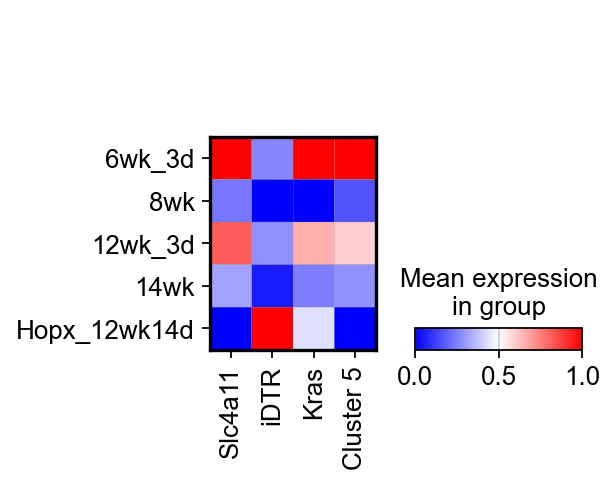

In [33]:
sc.pl.matrixplot(adata,['Slc4a11','iDTR','Kras','Cluster 5'],'Group',cmap='bwr', standard_scale='var')

## Examine Groupings

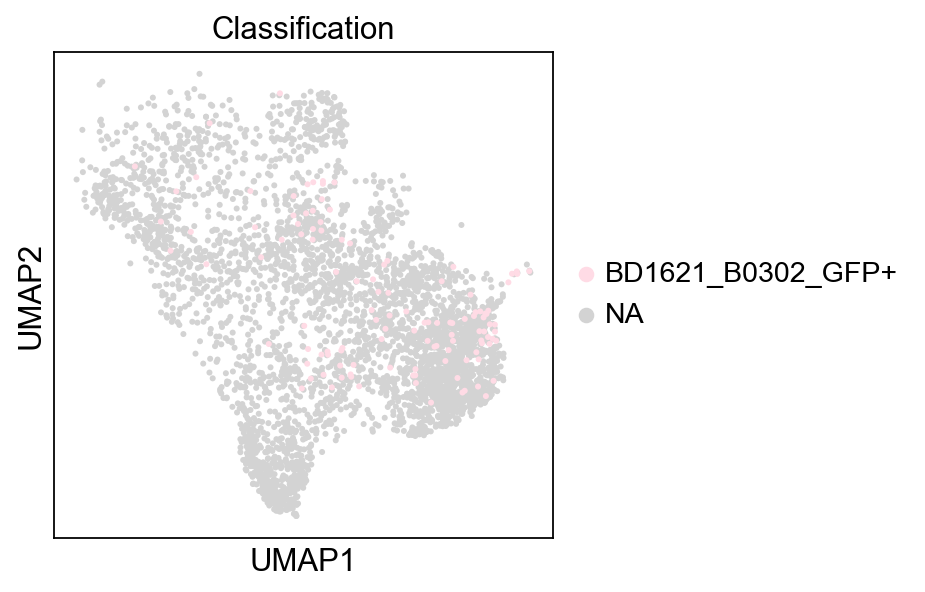

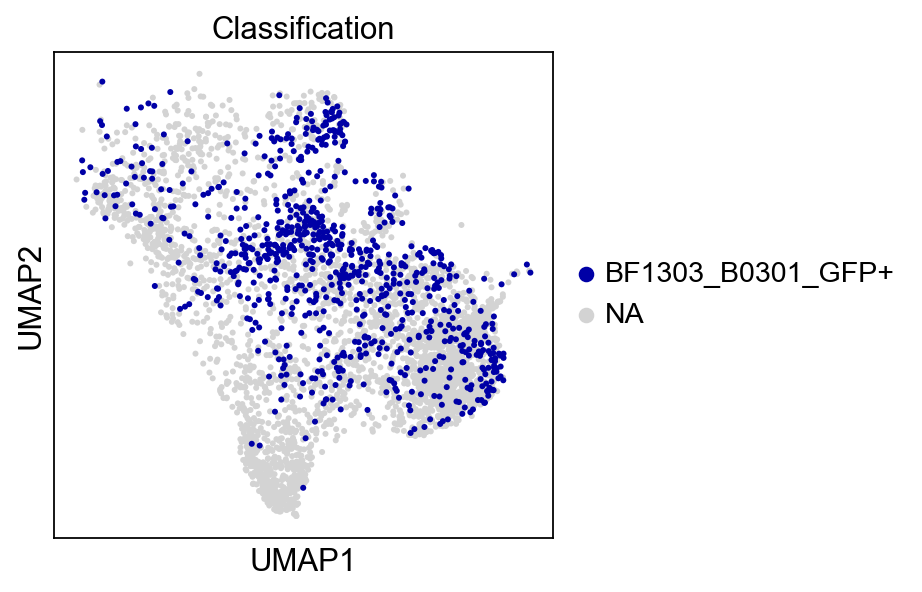

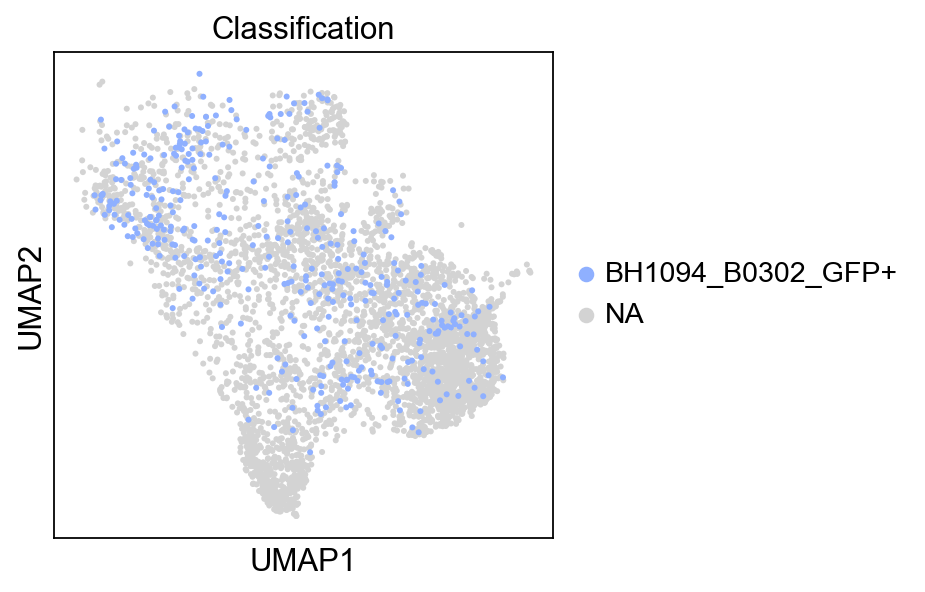

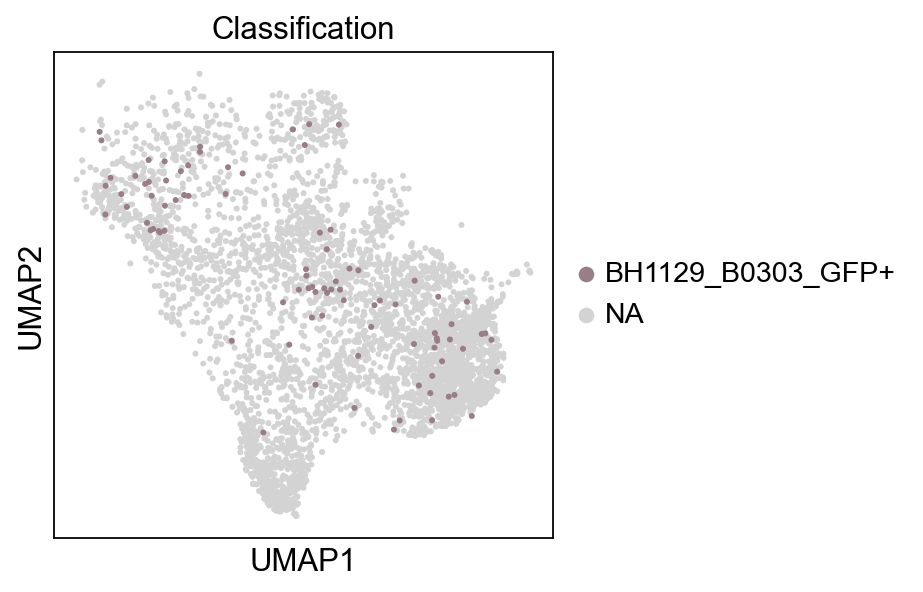

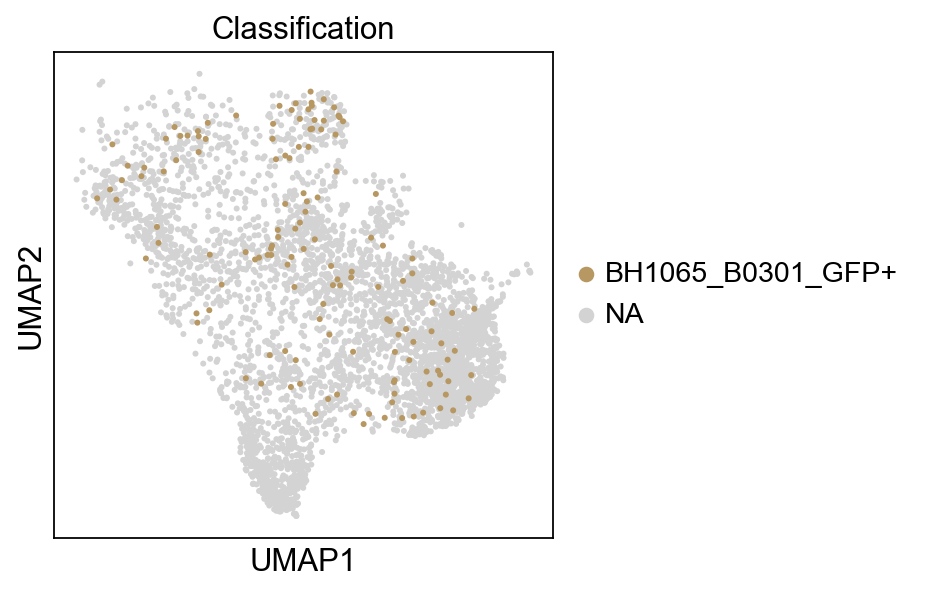

...

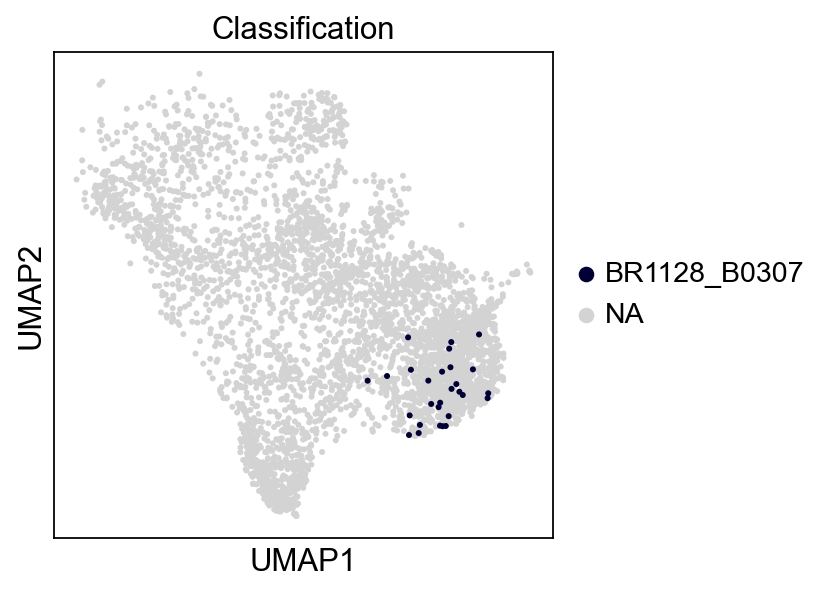

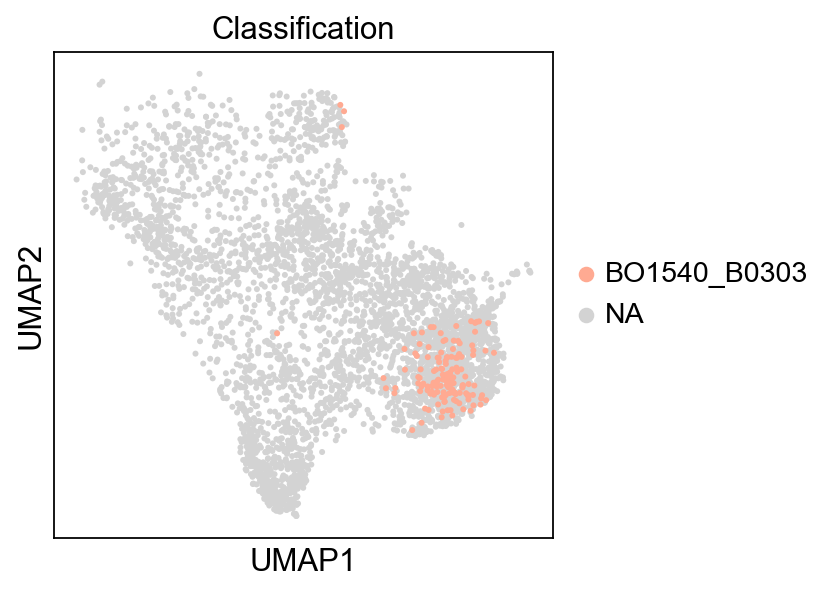

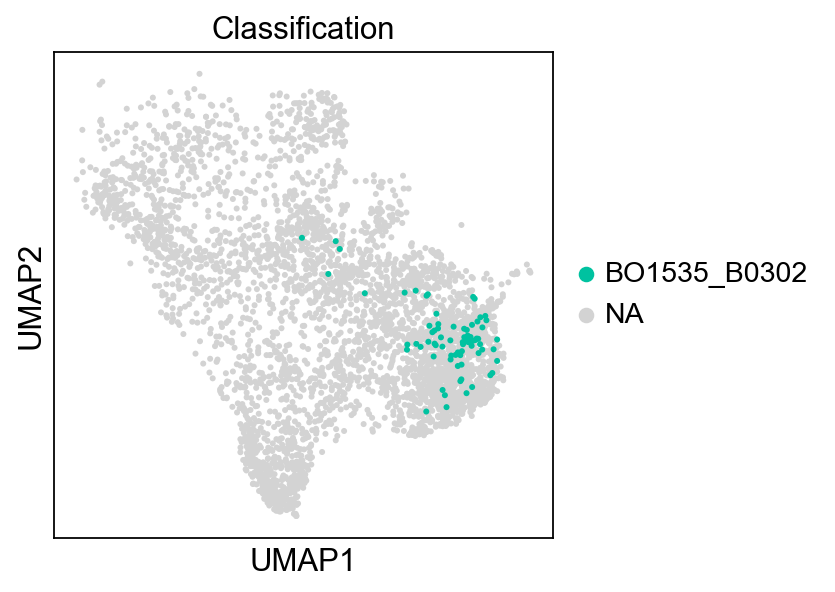

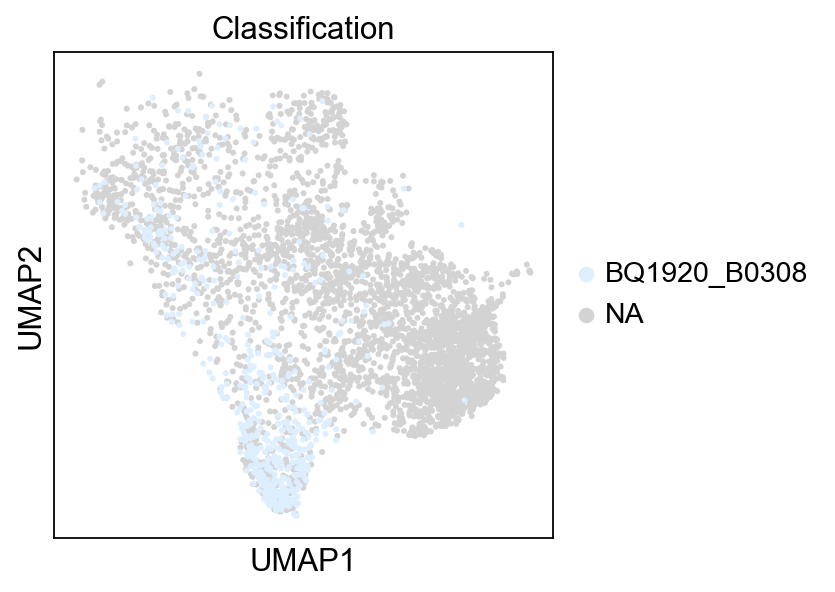

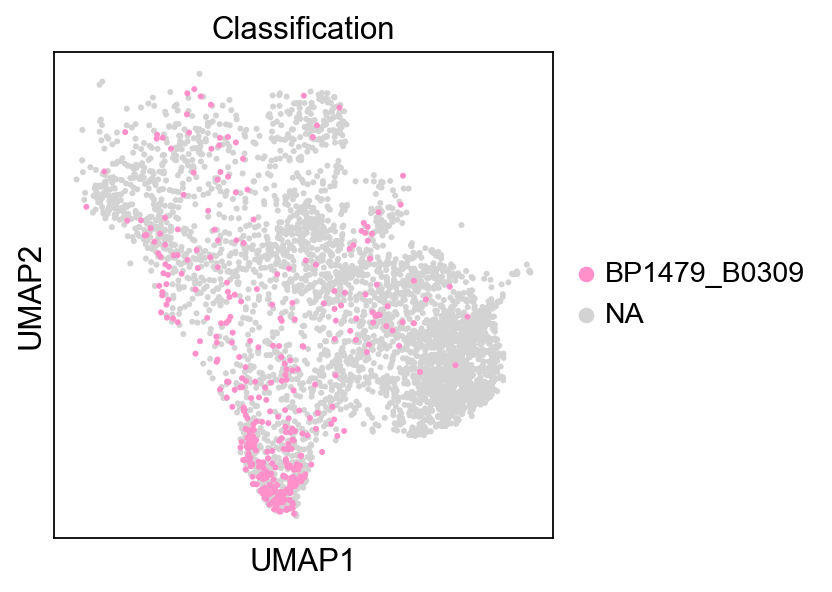

In [34]:
for label in adata.obs['Classification'].unique():
    sc.pl.umap(adata, color='Classification',groups=[label])

In [35]:
sc.tl.embedding_density(adata,basis='umap', groupby='Group')

computing density on 'umap'
--> added
    'umap_density_Group', densities (adata.obs)
    'umap_density_Group_params', parameter (adata.uns)


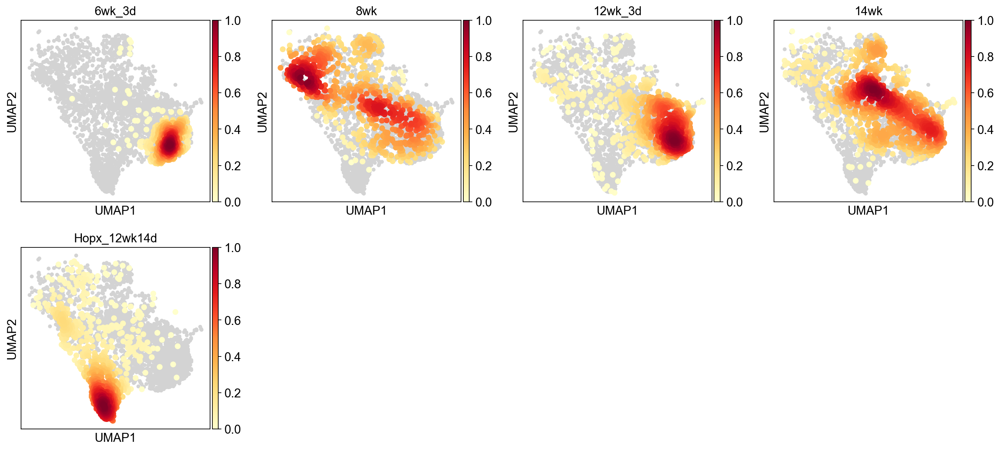

In [36]:
sc.pl.embedding_density(adata,basis='umap',key='umap_density_Group', )

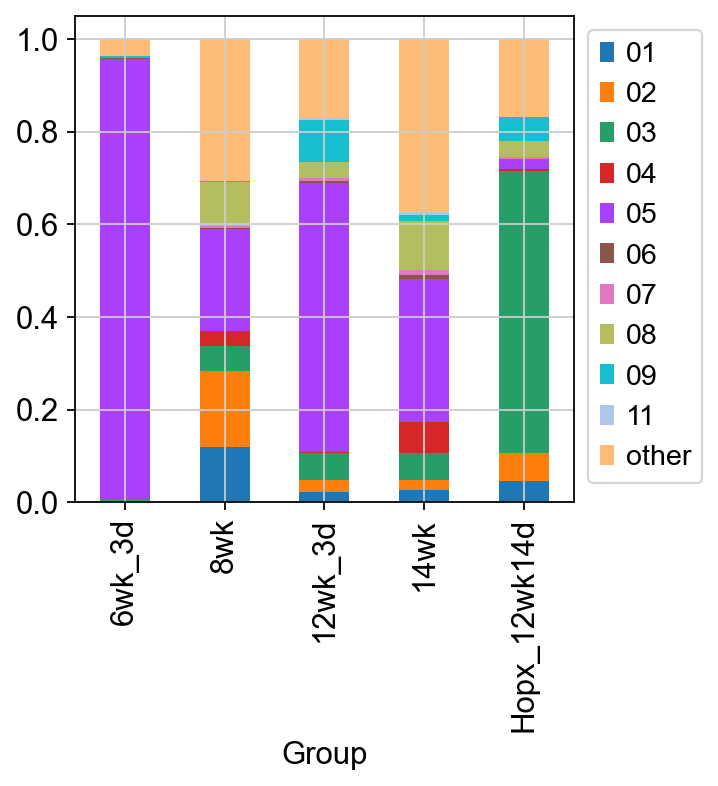

In [37]:
 cell_proportion_df = pd.crosstab(adata.obs['clusterK12_stringent'],adata.obs['Group'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

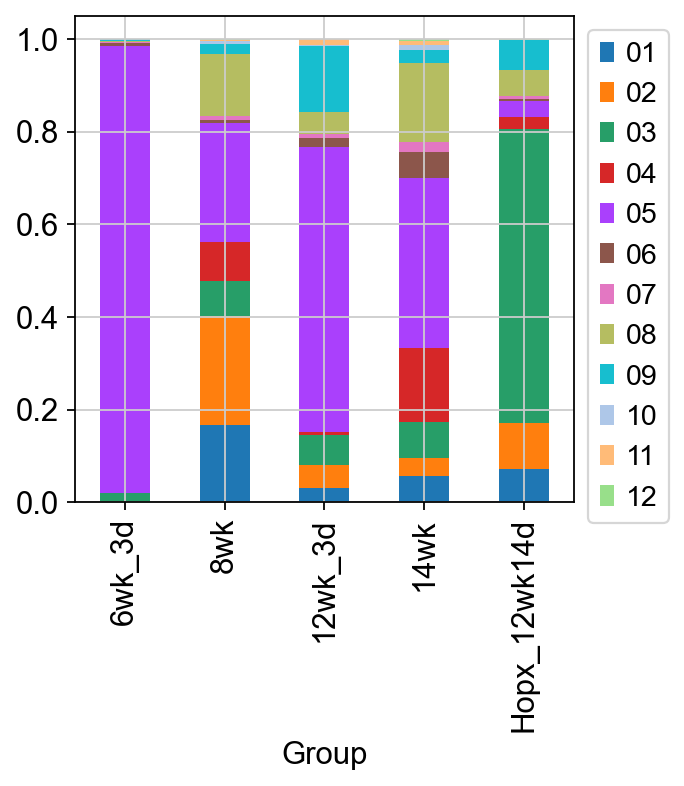

In [38]:
 cell_proportion_df = pd.crosstab(adata.obs['clusterK12'],adata.obs['Group'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [39]:
adata.obs[['Group','Classification']].value_counts(sort=False)

Group         Classification   
6wk_3d        BO1535_B0302          75
              BO1540_B0303         142
              BR1128_B0307          28
              BR1615_B0304         156
              BS1265_B0305         174
8wk           BH1065_B0301_GFP+    138
              BH1094_B0302_GFP+    376
              BH1129_B0303_GFP+     90
              BH1290_B0304_GFP+    138
12wk_3d       BL1121_B0304          57
              BL1124_B0305          67
              BL1233_B0306          58
              BL1237_B0302         239
              BL1606_B0303         354
              BL1646_B0301         102
14wk          BD1621_B0302_GFP+    119
              BF1303_B0301_GFP+    811
              BH1066_GFP+           61
Hopx_12wk14d  BP1479_B0309         361
              BQ1920_B0308         550
Name: count, dtype: int64

In [64]:
adata.uns['cell type_colors'] = ['#1f77b4',
 '#279e68',
 '#ff7f0e',
 '#aa40fc',
 '#d62728',
 '#e377c2',
 '#8c564b',
 'gray']

In [65]:
adata.obs['cell type'].value_counts(sort=False)

cell type
AT1-like                 818
AT2-like                 704
EMT                       12
Embryonic liver-like     193
HPCS                    1757
Highly proliferative      83
Lung endoderm-like       529
Name: count, dtype: int64

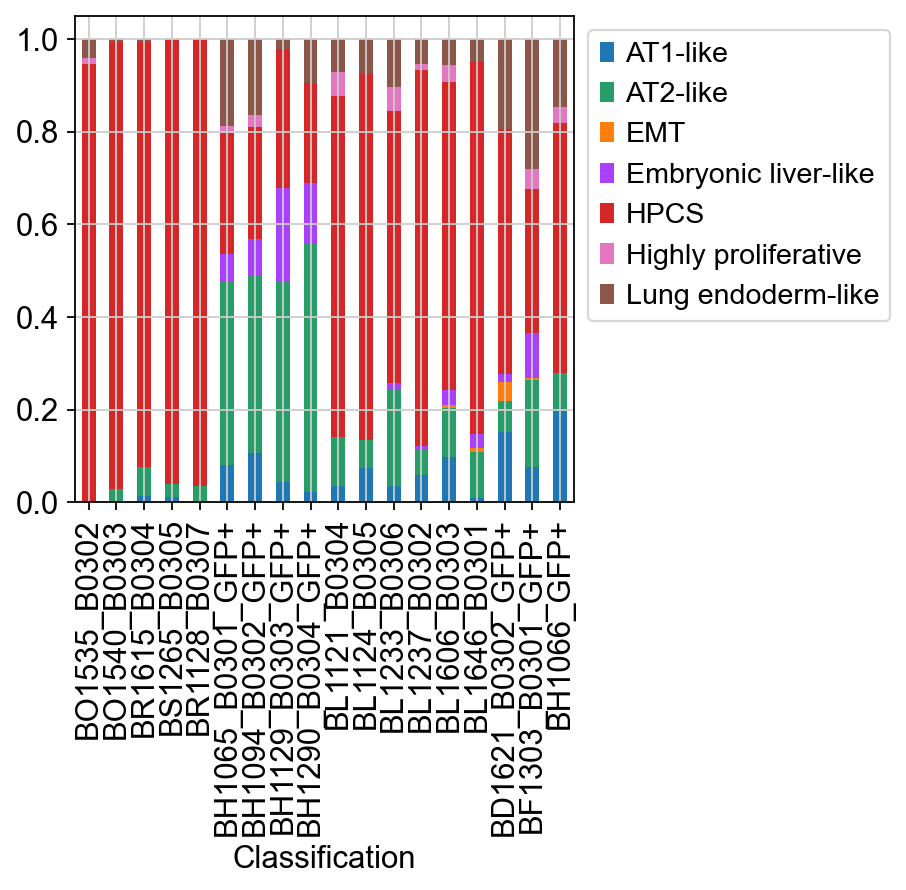

In [66]:
ordered = ['BO1535_B0302', 'BO1540_B0303', 'BR1615_B0304', 'BS1265_B0305','BR1128_B0307', # 6wk 3d
           'BH1065_B0301_GFP+','BH1094_B0302_GFP+','BH1129_B0303_GFP+','BH1290_B0304_GFP+', # 6wk 14d
           'BL1121_B0304','BL1124_B0305','BL1233_B0306','BL1237_B0302','BL1606_B0303','BL1646_B0301', #12wk 3d
           'BD1621_B0302_GFP+','BF1303_B0301_GFP+','BH1066_GFP+'] # 12wk 14d
cell_proportion_df = pd.crosstab(adata.obs['cell type'],adata.obs['Classification'], normalize='columns')[ordered].T.plot(kind='bar', stacked=True, color=adata.uns['cell type_colors']).legend(bbox_to_anchor=(1,1))

In [67]:
sc.tl.embedding_density(adata,basis='umap', groupby='Classification')

computing density on 'umap'
--> added
    'umap_density_Classification', densities (adata.obs)
    'umap_density_Classification_params', parameter (adata.uns)


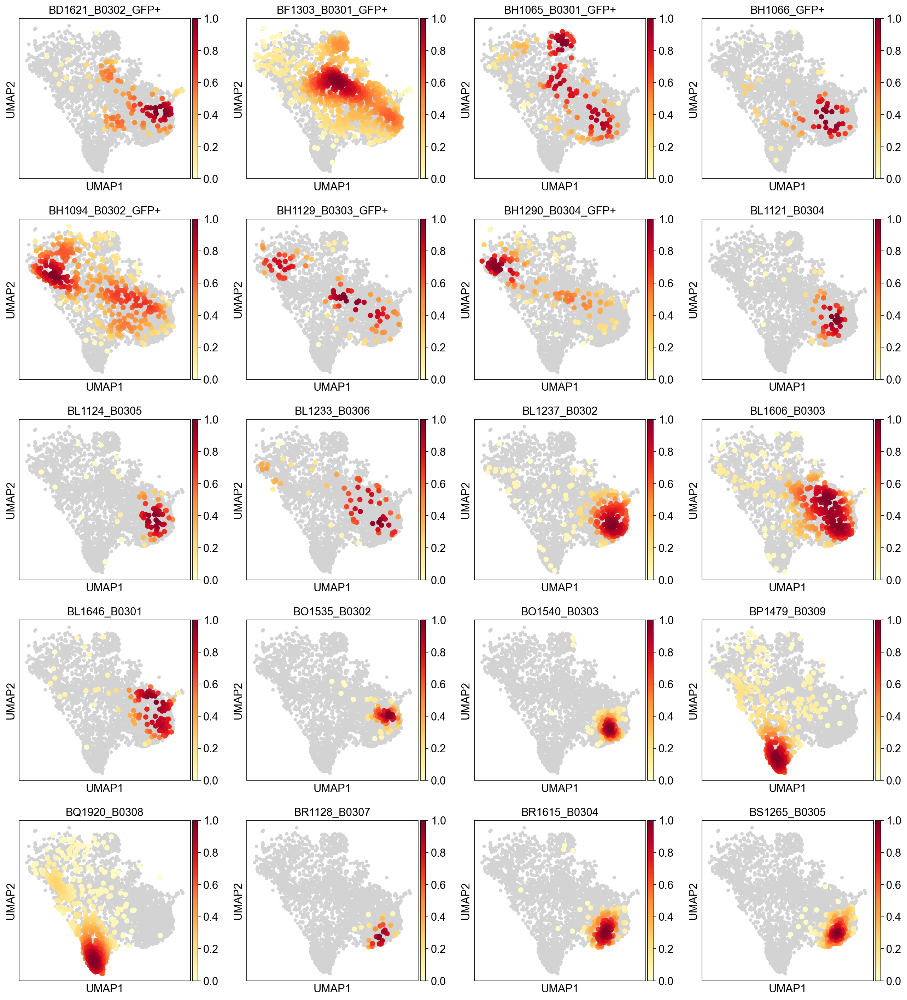

In [68]:
sc.pl.embedding_density(adata,basis='umap',key='umap_density_Classification')

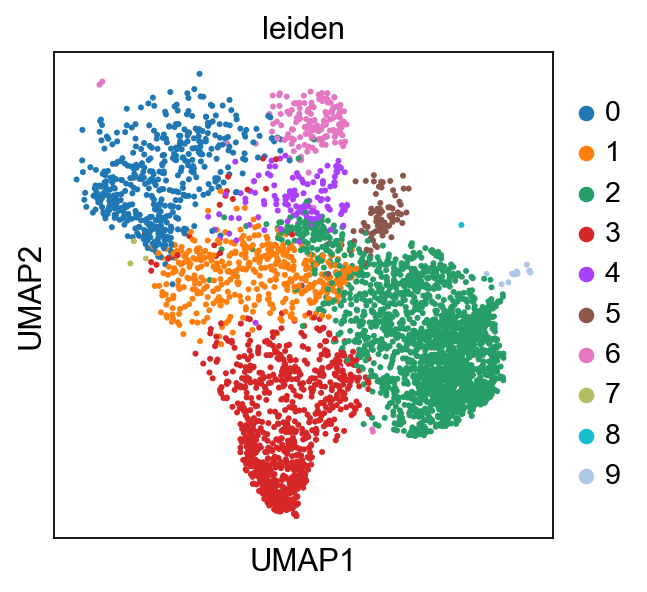

In [69]:
sc.pl.umap(adata, color=['leiden'])

## Evaluate rough clusters

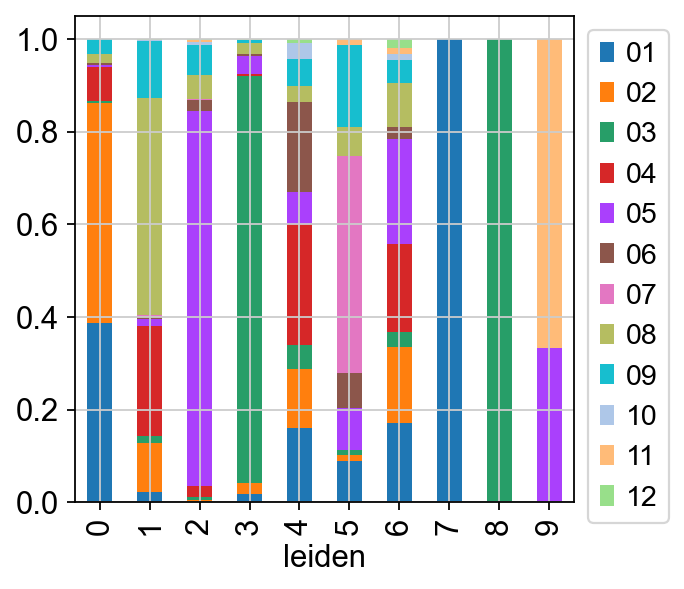

In [70]:
 cell_proportion_df = pd.crosstab(adata.obs['clusterK12'],adata.obs['leiden'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

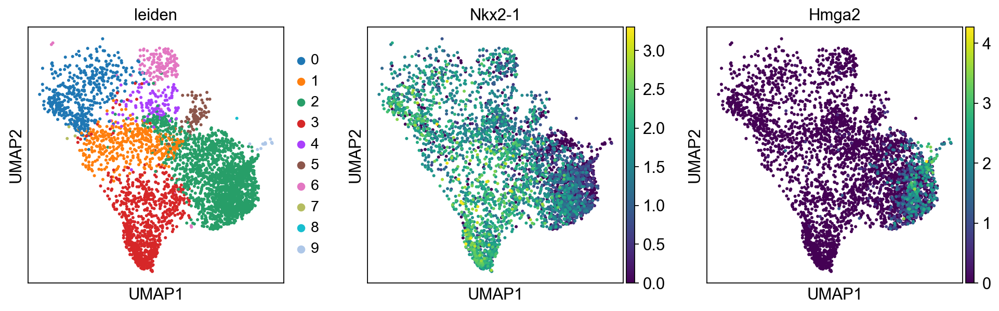

In [71]:
sc.pl.umap(adata, color=['leiden','Nkx2-1','Hmga2'])

## Figures for the paper

### Generate bar graph figures

In [72]:
adata2 = adata[adata.obs.Group.isin(['14wk']),:] # should this be extended to the 12wk_3d 

In [73]:
adata2.obs['HPCS_cell'] = [1  if x == 'HPCS' else 0 for x in adata2.obs['cell type']]

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_34822/309636913.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata2.obs['HPCS_cell'] = [1  if x == 'HPCS' else 0 for x in adata2.obs['cell type']]


In [74]:
adata3 = adata[adata.obs.Group.isin(['8wk']),:] # should this be extended to the 6wk_3d

In [75]:
adata3.obs['HPCS_cell'] = [1  if x == 'HPCS' else 0 for x in adata3.obs['cell type']]

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_34822/1242395224.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata3.obs['HPCS_cell'] = [1  if x == 'HPCS' else 0 for x in adata3.obs['cell type']]


#### 14 week timepoints

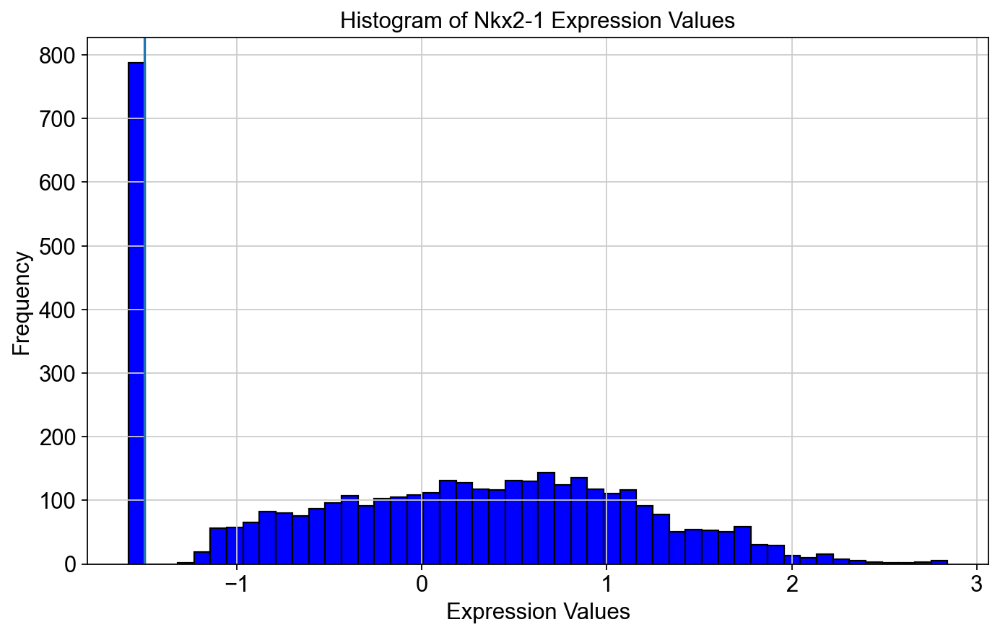

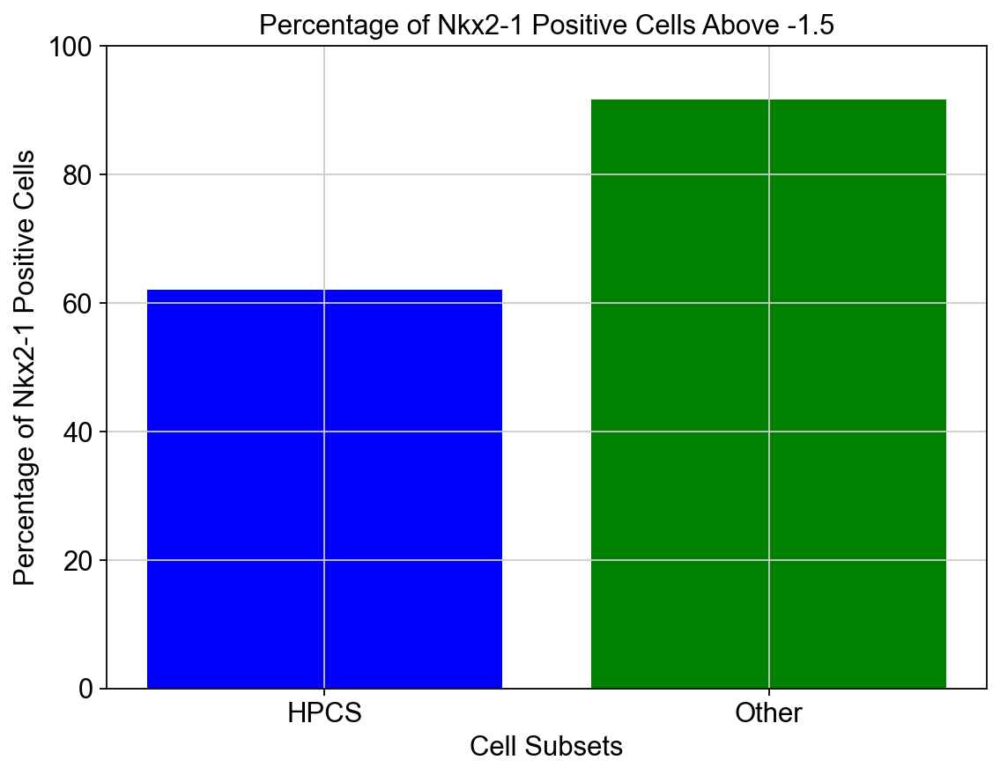

SignificanceResult(statistic=0.1500231517209446, pvalue=1.2562471615069839e-28)

In [76]:
gene = 'Nkx2-1'
expression_values = adata[:, gene].X
threshold = -1.5

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Fig2i_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

# calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

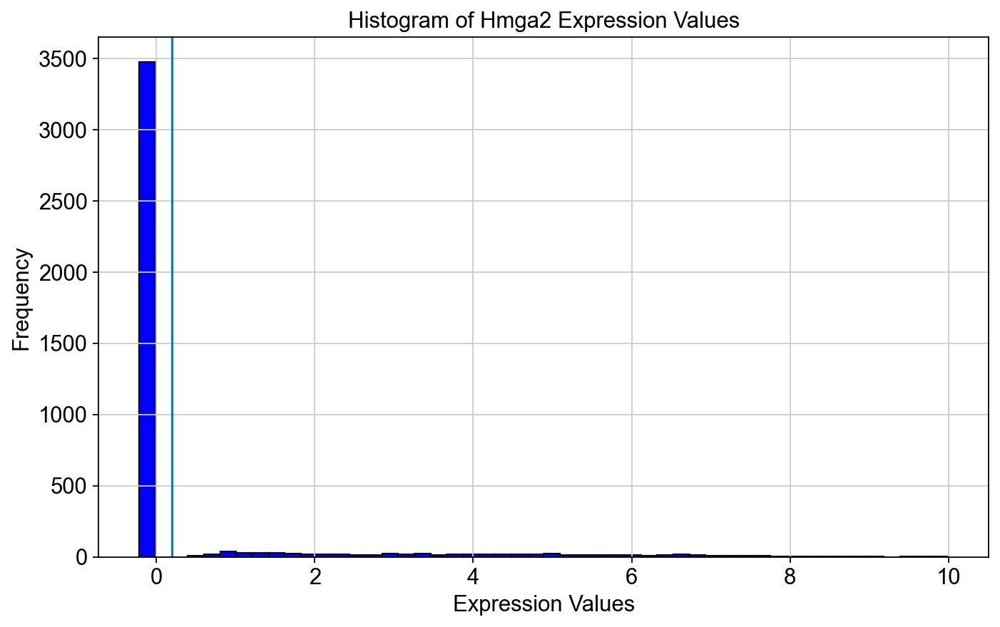

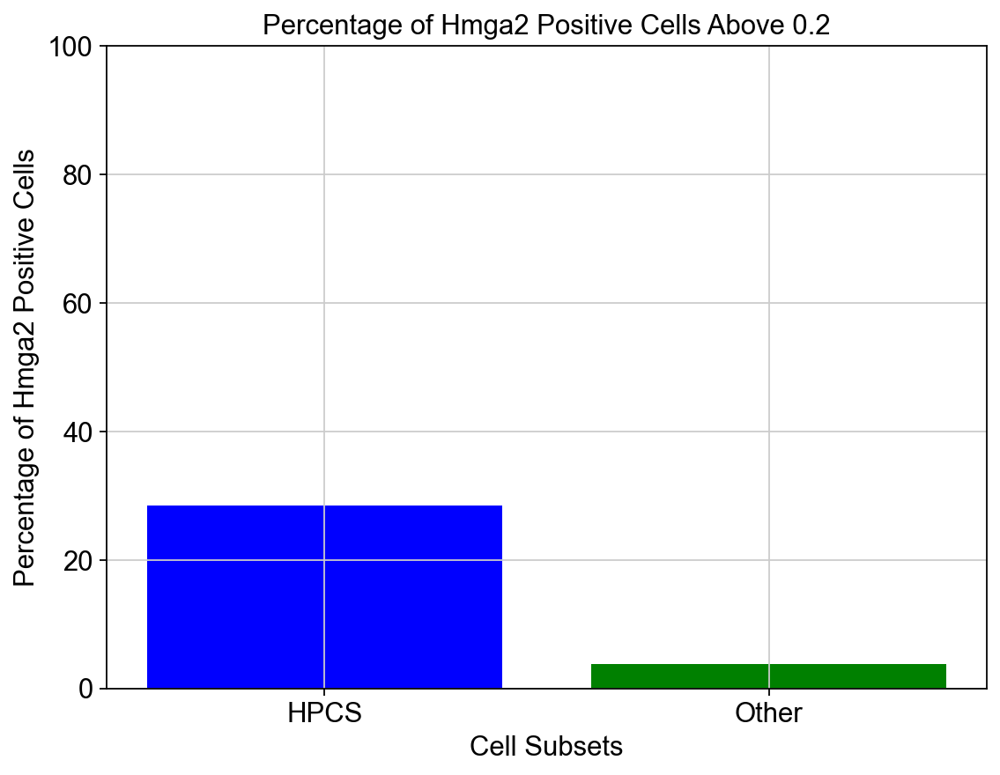

SignificanceResult(statistic=10.254518072289157, pvalue=2.4144916862007014e-28)

In [77]:
gene = 'Hmga2'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Fig2i_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

# Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

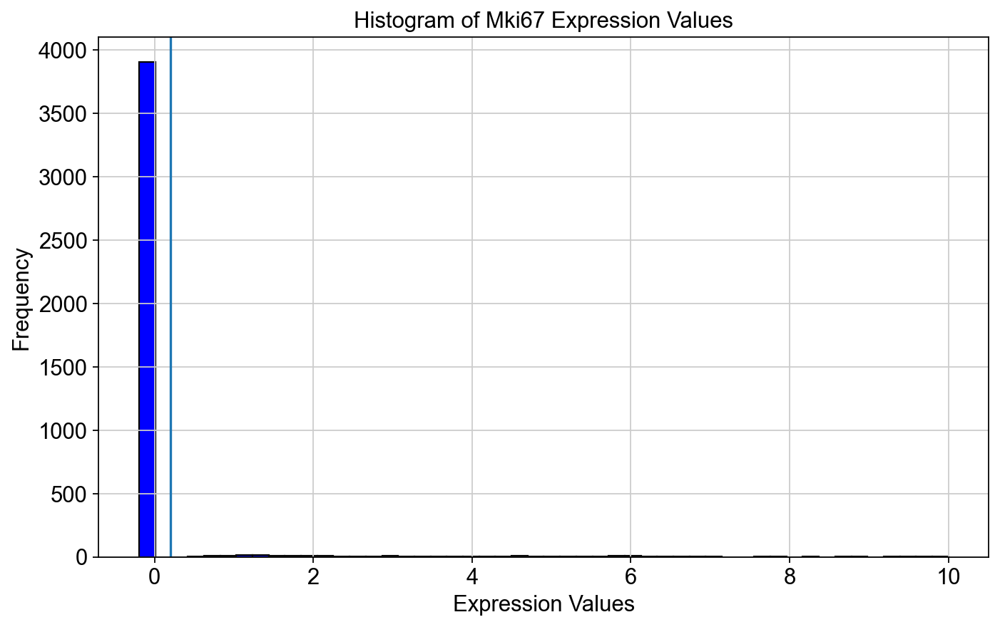

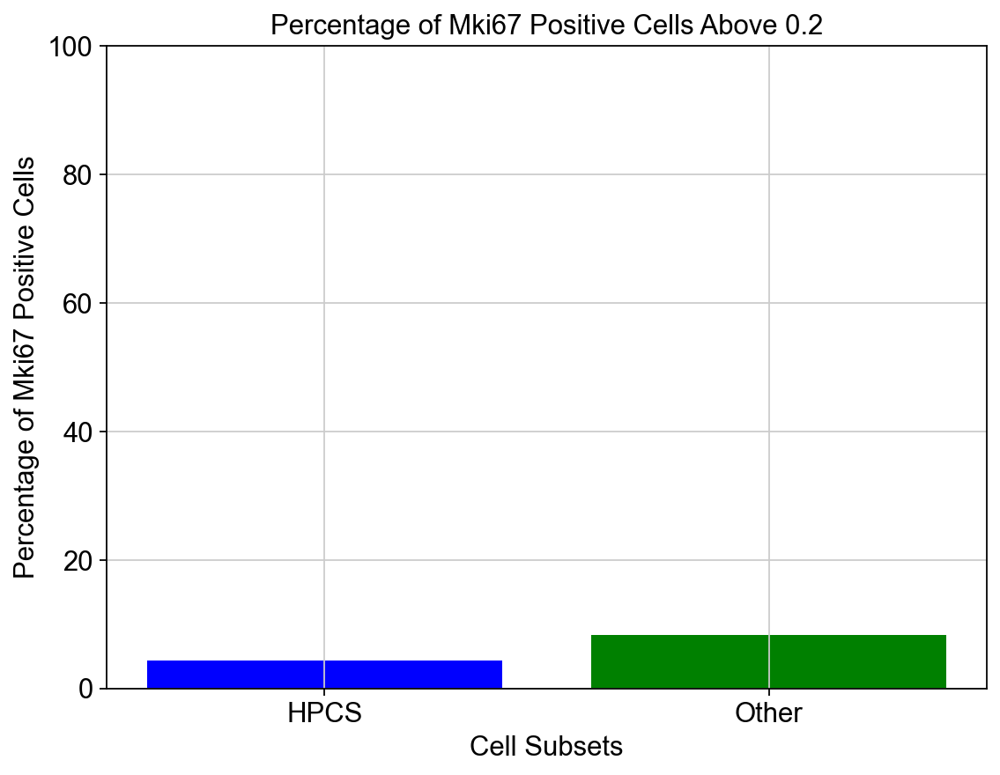

SignificanceResult(statistic=0.5014448410674825, pvalue=0.02449848250753537)

In [78]:
gene = 'Mki67'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Fig2i_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

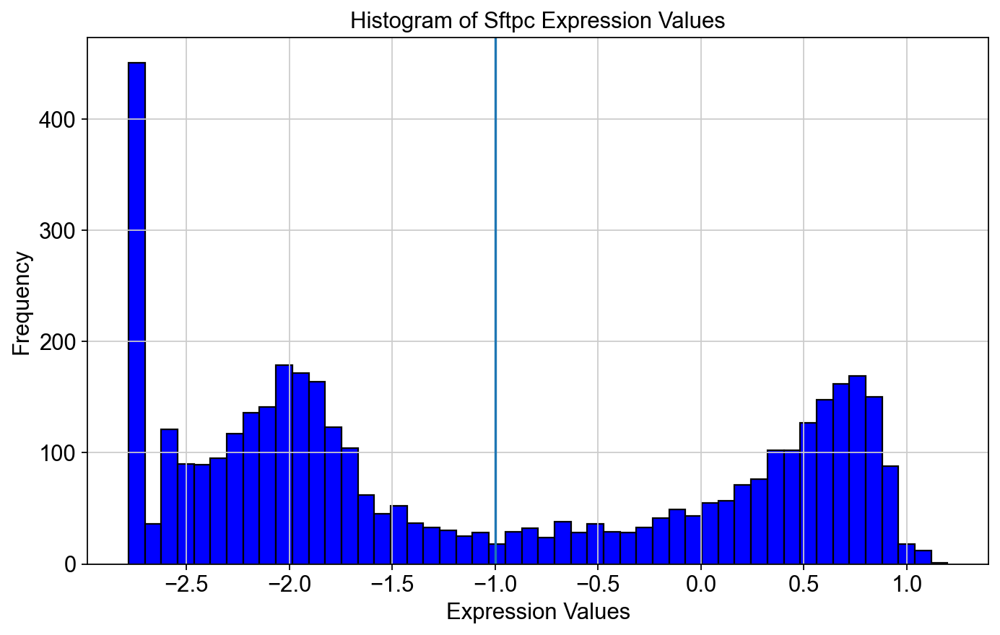

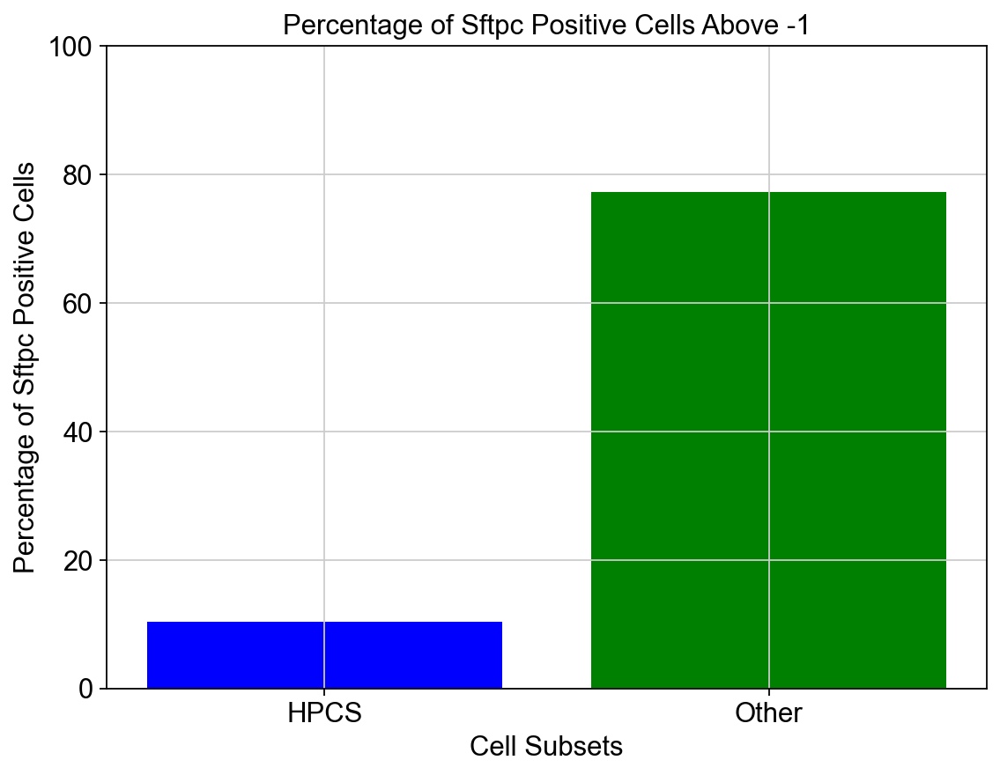

SignificanceResult(statistic=0.03389568178300573, pvalue=6.591163126287138e-99)

In [79]:
gene = 'Sftpc'
expression_values = adata[:, gene].X
threshold = -1

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Fig2i_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

# Calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

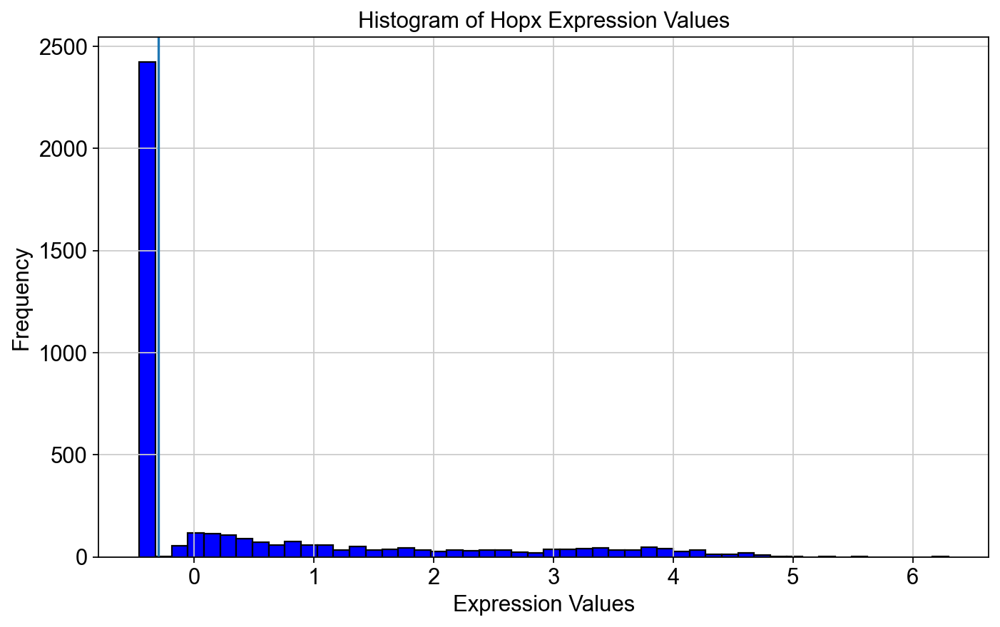

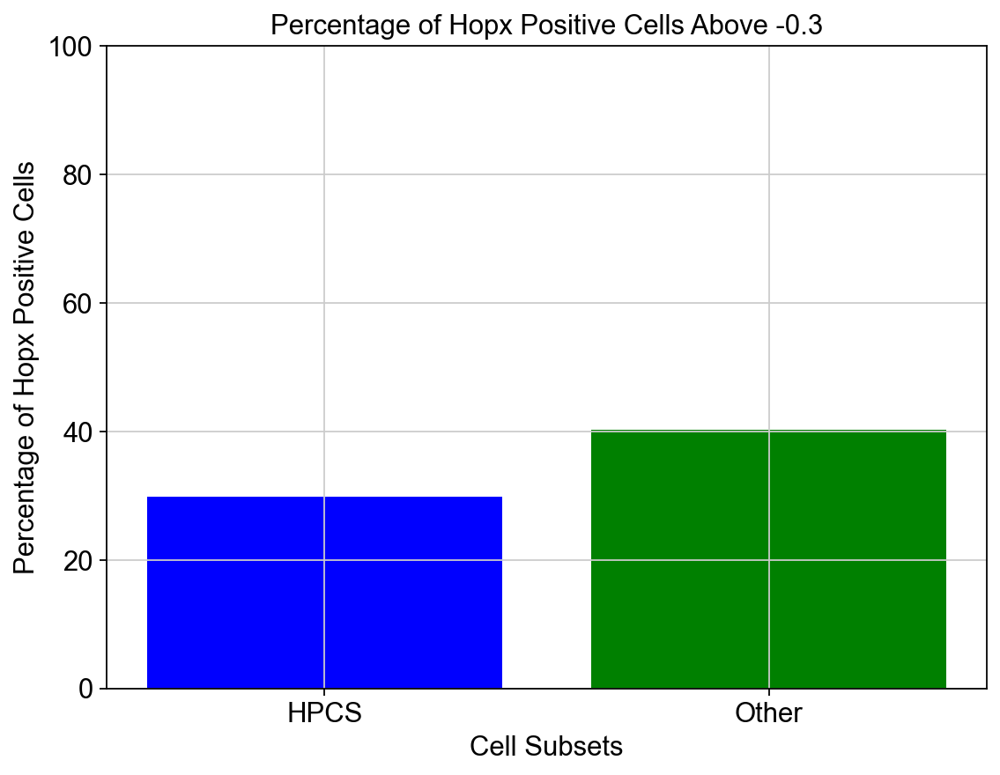

SignificanceResult(statistic=0.6319387302993861, pvalue=0.0011750474626790806)

In [80]:
gene = 'Hopx'
expression_values = adata[:, gene].X
threshold = -0.3

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Fig2i_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

#Calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

#### 8 week timepoints

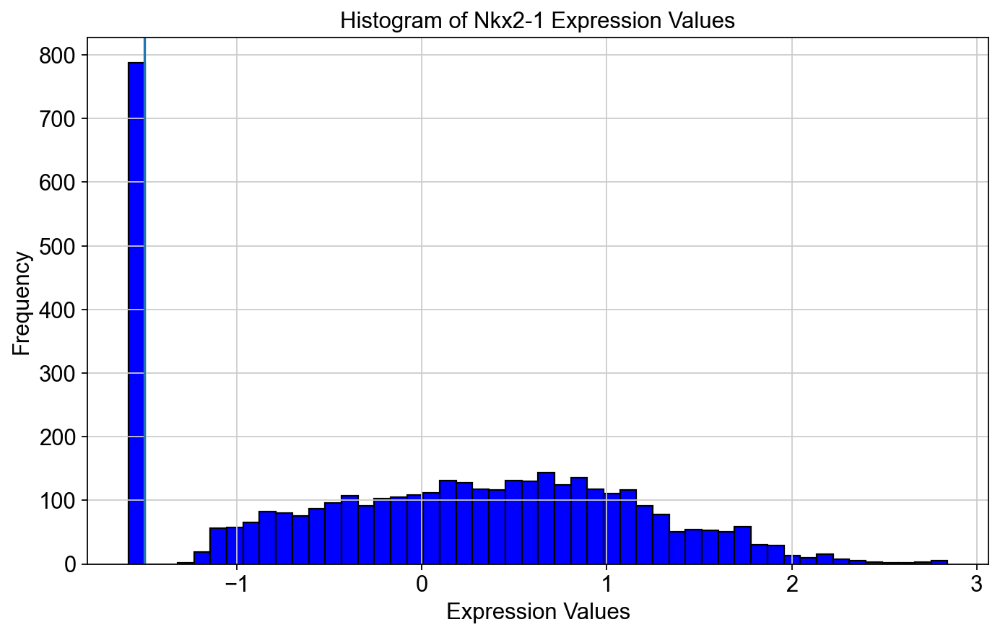

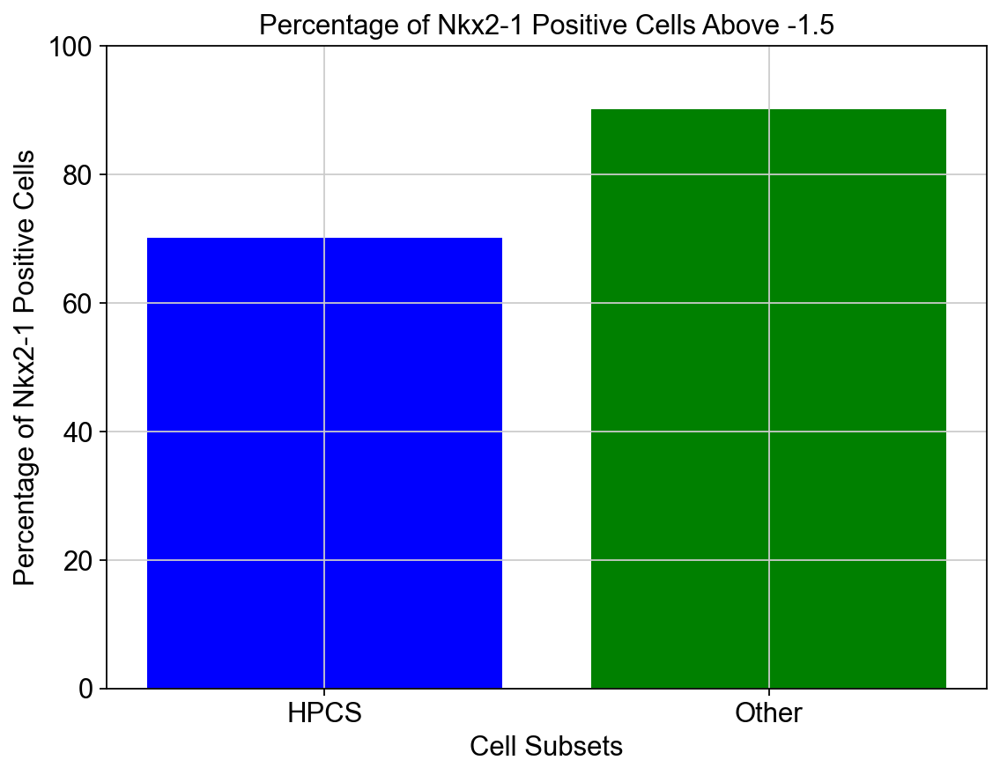

SignificanceResult(statistic=0.25646123260437376, pvalue=5.91755744331729e-10)

In [81]:
gene = 'Nkx2-1'
expression_values = adata[:, gene].X
threshold = -1.5

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:] #6 week
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:] #12 week

# Extract the expression values for the gene 'Mki67' for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig5f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

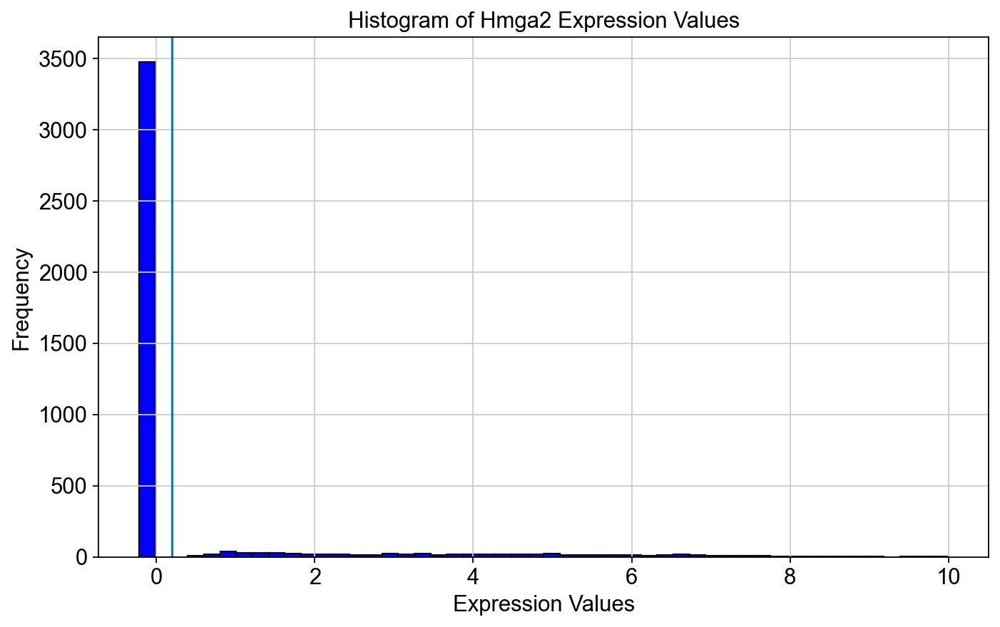

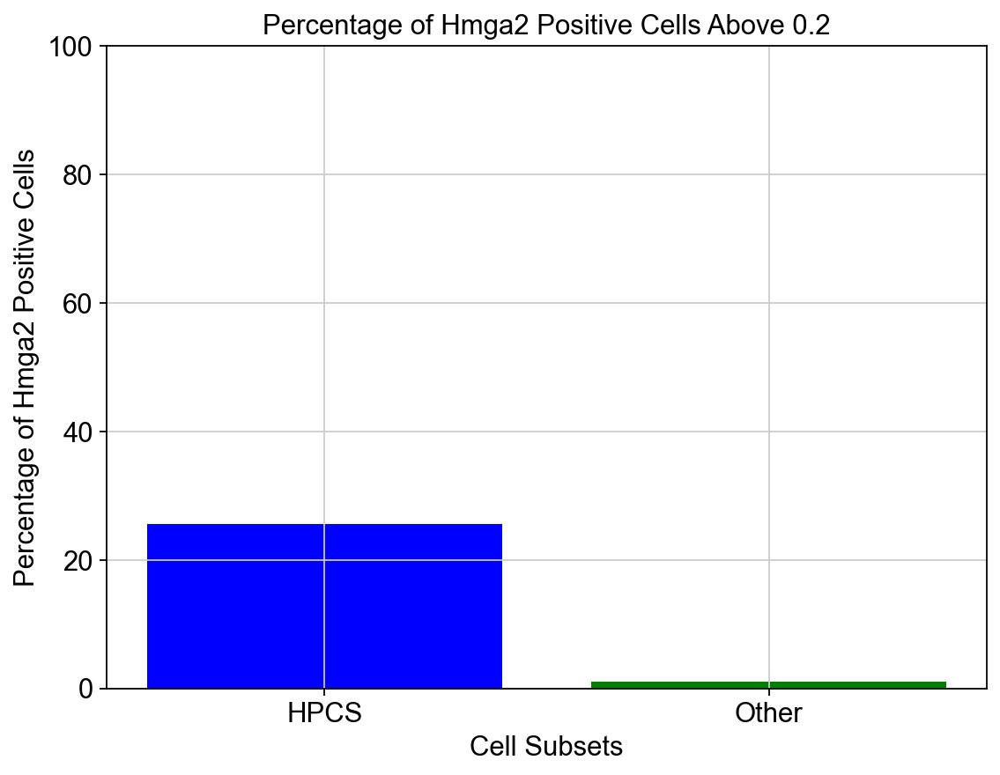

SignificanceResult(statistic=31.562043795620436, pvalue=1.5323631240582304e-24)

In [82]:
gene = 'Hmga2'
expression_values = adata[:, gene].X
threshold = .2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig5f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

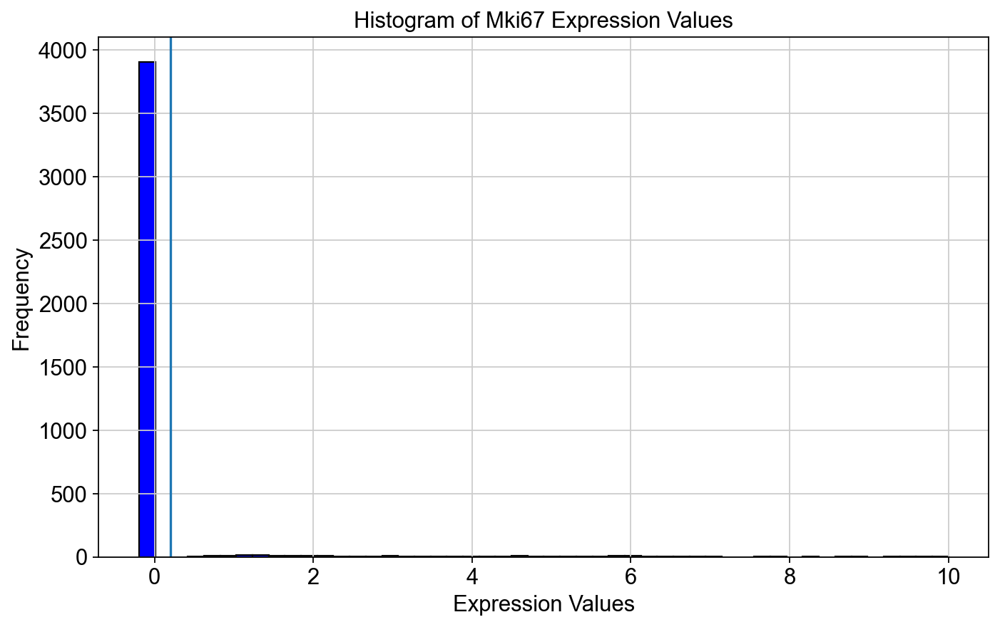

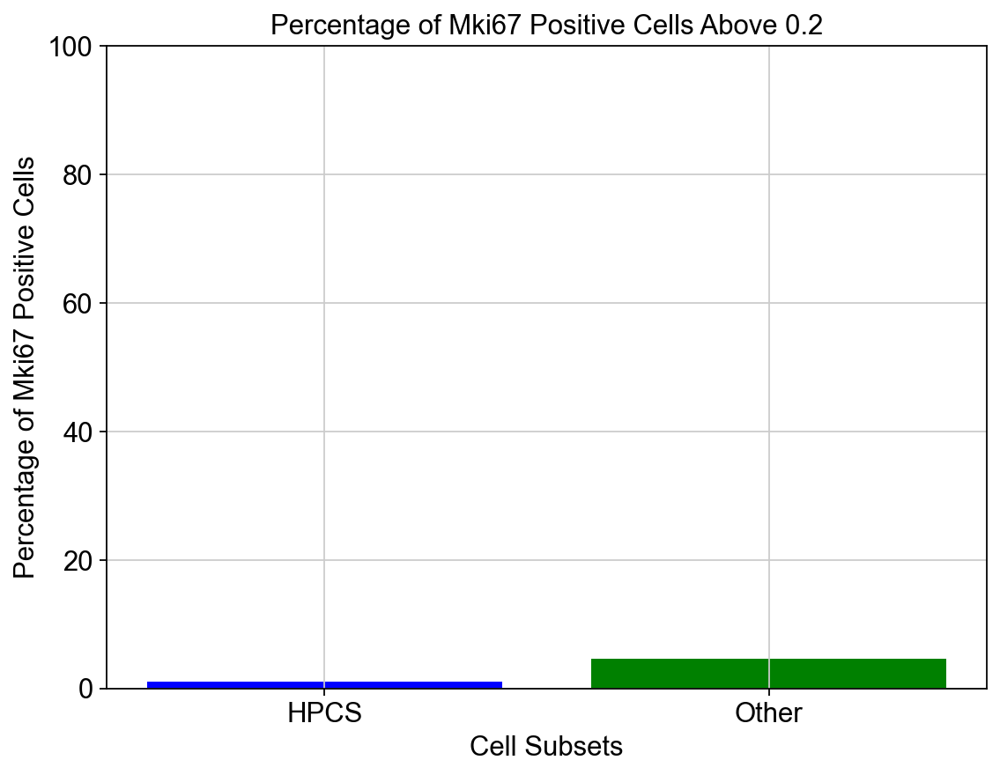

SignificanceResult(statistic=0.22485207100591717, pvalue=0.025249971923149834)

In [83]:
gene = 'Mki67'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig5f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

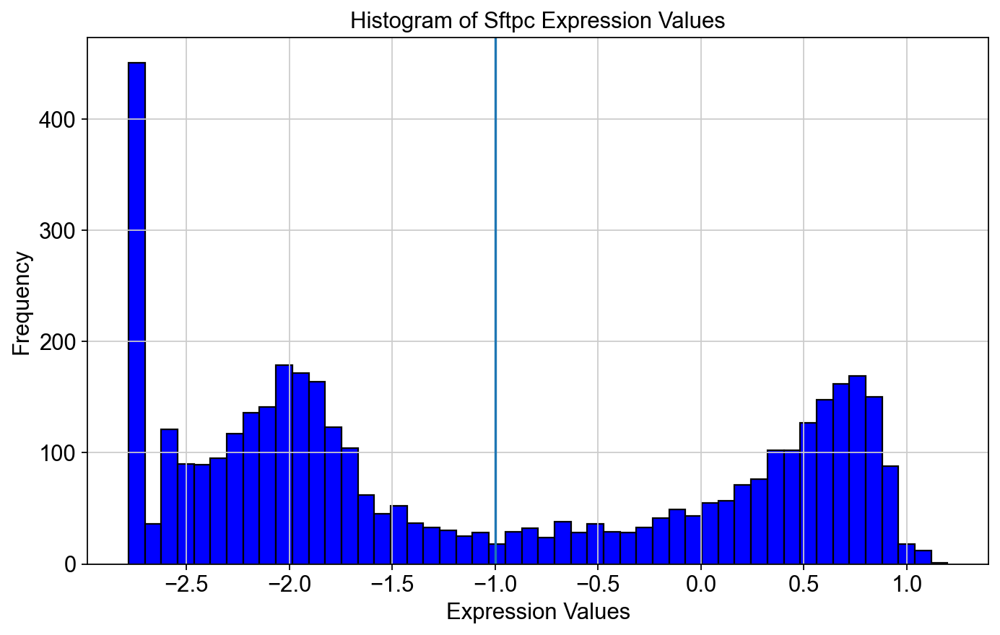

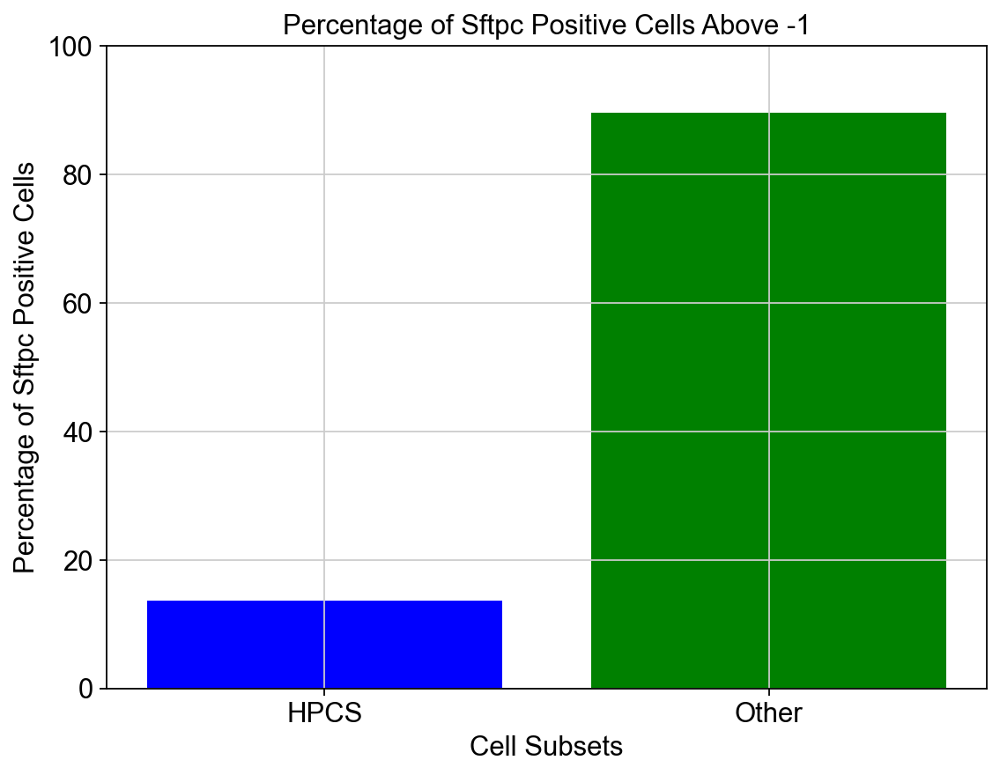

SignificanceResult(statistic=0.018238993710691823, pvalue=1.1078063394073968e-83)

In [84]:
gene = 'Sftpc'
expression_values = adata[:, gene].X
threshold = -1

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:] #6 week
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:] #12 week

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig5f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

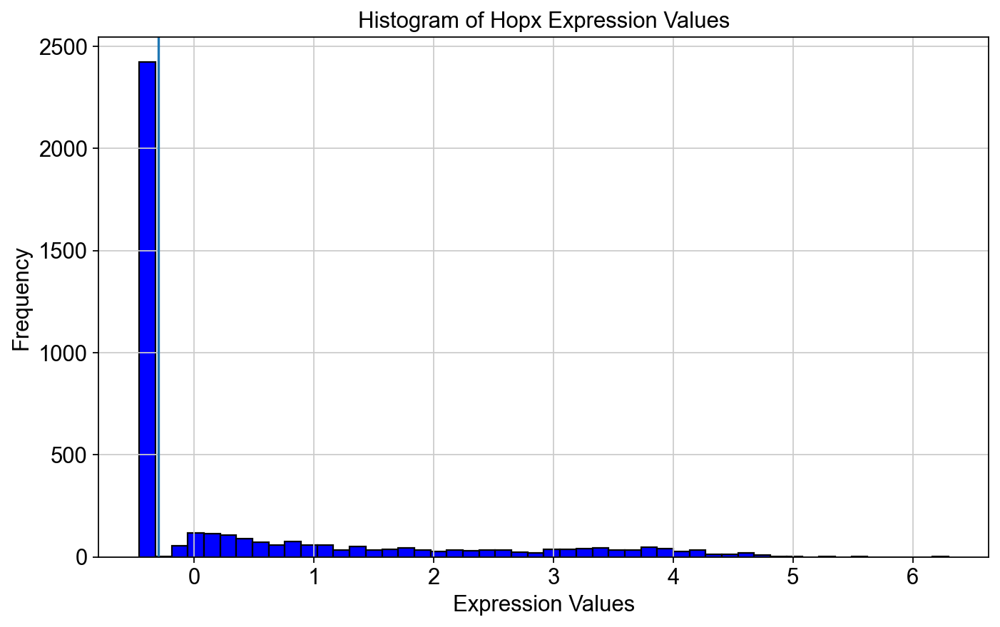

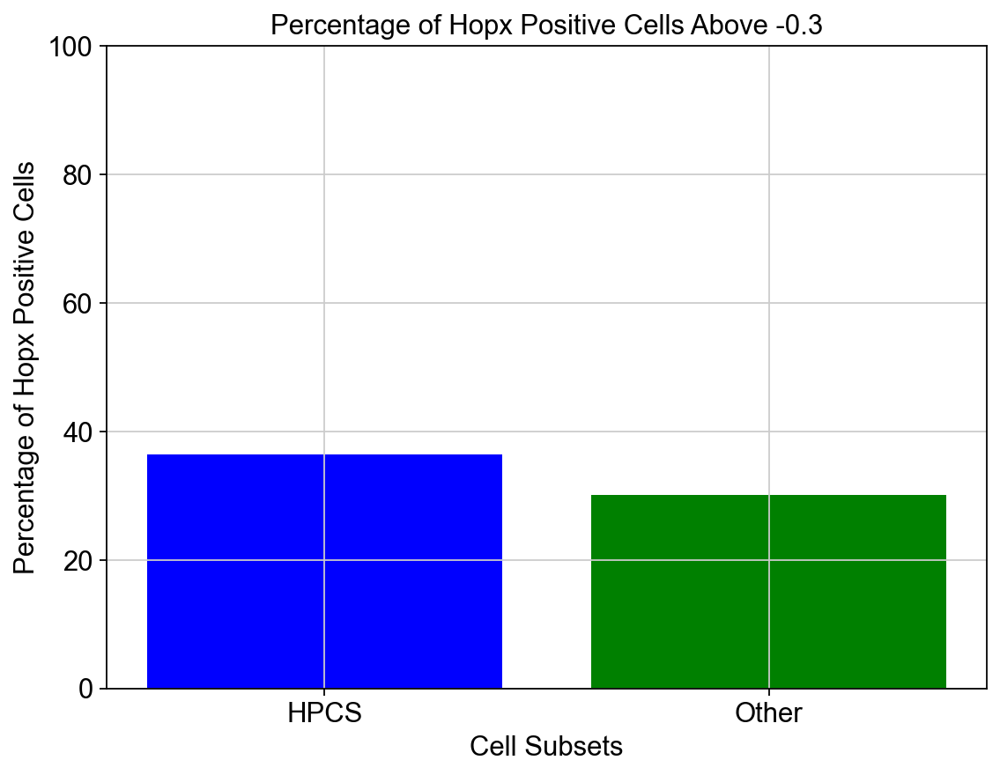

SignificanceResult(statistic=1.3293650793650793, pvalue=0.12053034491290136)

In [85]:
gene = 'Hopx'
expression_values = adata[:, gene].X
threshold = -0.3

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig5f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

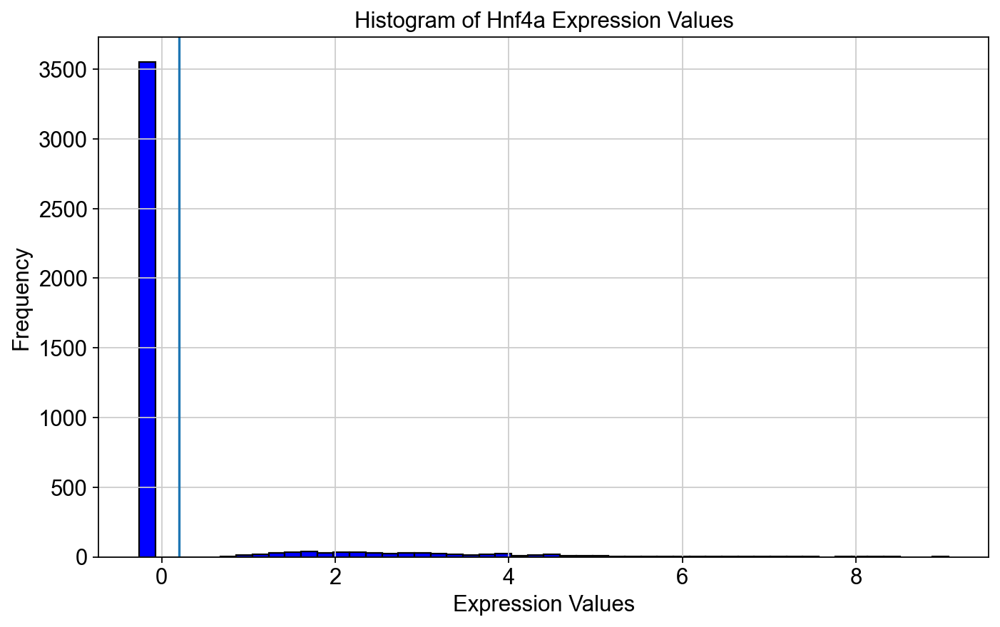

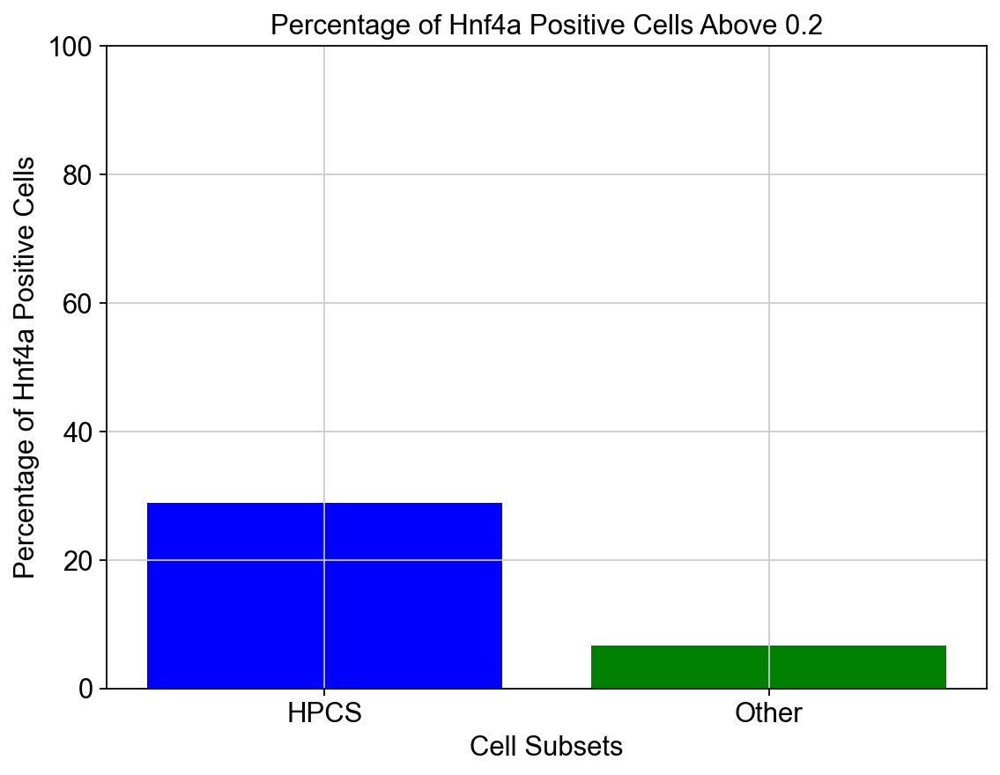

SignificanceResult(statistic=5.696925933567155, pvalue=1.2789868836366187e-13)

In [86]:
gene = 'Hnf4a'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:] #6 week
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:] #12 week

# Extract the expression values for the gene 'Mki67' for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig5f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

### Generate uMAPs

In [91]:
adata.obs['cell type']

AAACCCAGTAGCGTAG-1-14wk-traced                    AT1-like
AAACGAATCAAGTCGT-1-14wk-traced          Lung endoderm-like
AAAGAACAGATGACAT-1-14wk-traced                    AT2-like
AAAGGGCTCACTTGTT-1-14wk-traced                    AT1-like
AAAGGTATCCATAGGT-1-14wk-traced        Embryonic liver-like
                                              ...         
TGTCACTTCAGCAGAG-1-12wk_14d-traced                AT1-like
TGTCATGAGTGCCAGT-1-12wk_14d-traced                AT1-like
TGTCATTCACCTACGT-1-12wk_14d-traced                AT1-like
TGTCCCTGTTAGCATC-1-12wk_14d-traced                AT1-like
TGTGCGCGTCCATCAG-1-12wk_14d-traced    Embryonic liver-like
Name: cell type, Length: 4096, dtype: category
Categories (7, object): ['AT1-like', 'AT2-like', 'EMT', 'Embryonic liver-like', 'HPCS', 'Highly proliferative', 'Lung endoderm-like']

In [92]:
adata.uns['cell type_colors'] = ['#1f77b4',
 '#279e68',
 '#ff7f0e',
 '#aa40fc',
 '#d62728',
 '#e377c2',
 '#8c564b'] #'grey'

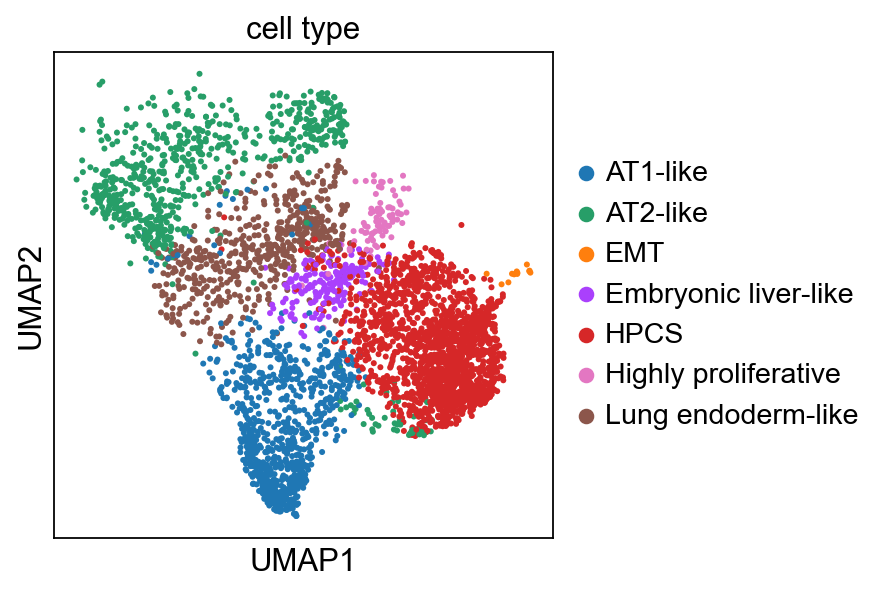

In [93]:
sc.pl.umap(adata,color=['cell type'], save='Ext_Data_Fig5a_cell state umap.svg')
#sc.pl.umap(adata,color=['Slc4a11'], save='Slc4a11 umap.svg', cmap='Reds')
#sc.pl.umap(adata,color=['iDTR'], save='DTR umap.svg', cmap='Reds')
#sc.pl.umap(adata,color=['Cluster 5'], save='Cluster 5 umap.svg', cmap='Reds')

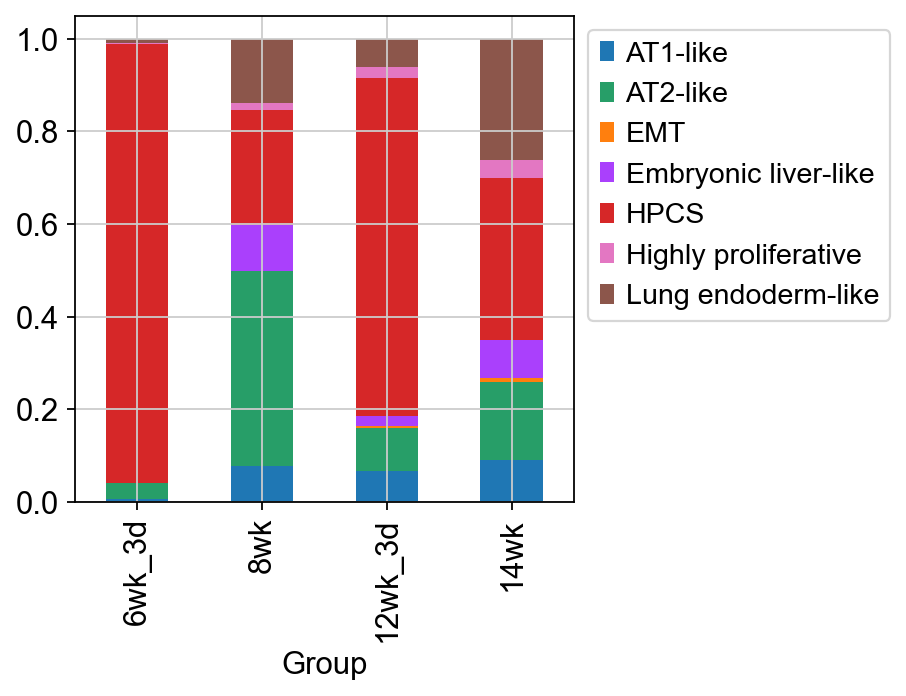

In [94]:
ordered = ['6wk_3d', '8wk','12wk_3d','14wk']
cell_proportion_df = pd.crosstab(adata.obs['cell type'],adata.obs['Group'], normalize='columns')[ordered].T.plot(kind='bar', stacked=True, color=adata.uns["cell type_colors"]).legend(bbox_to_anchor=(1,1))
cell_proportion_df.get_figure().savefig('figures/Fig2d_cell state proportions.svg')

In [96]:
adata[adata.obs.Group=='12wk_3d',:].obs['cell type'].value_counts(normalize=True)

cell type
HPCS                    0.729761
AT2-like                0.093501
AT1-like                0.067275
Lung endoderm-like      0.060433
Highly proliferative    0.025086
Embryonic liver-like    0.020525
EMT                     0.003421
Name: proportion, dtype: float64

In [97]:
adata.obs['Group'].value_counts()

Group
14wk            991
Hopx_12wk14d    911
12wk_3d         877
8wk             742
6wk_3d          575
Name: count, dtype: int64

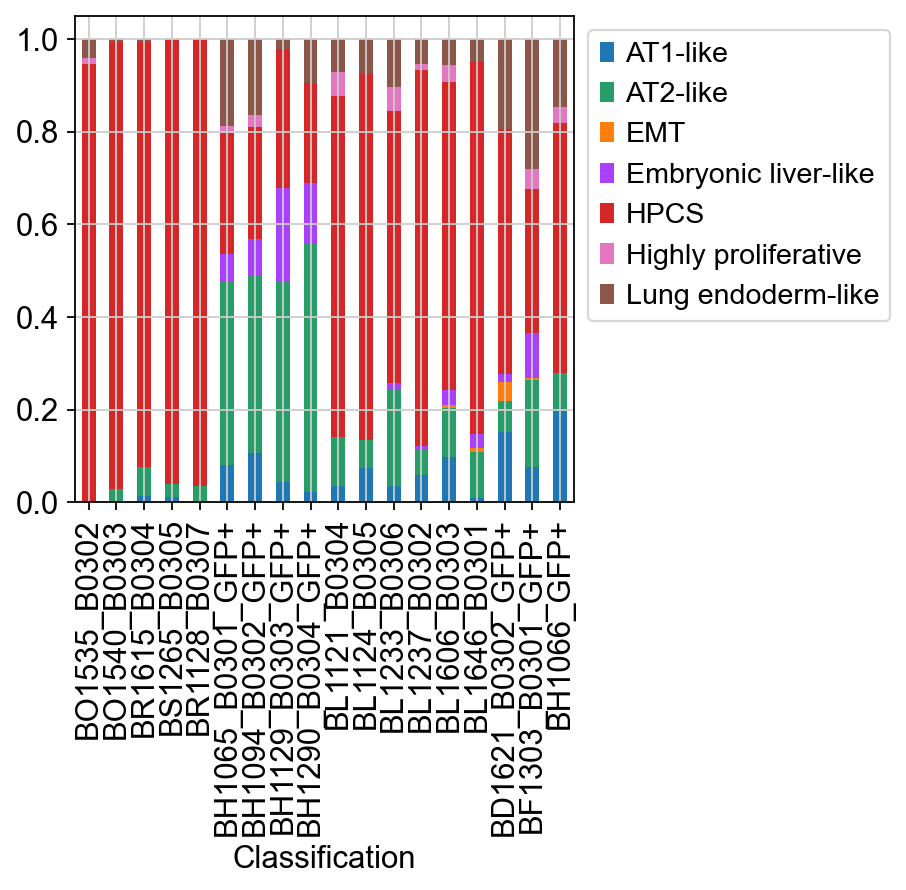

In [98]:
ordered = ['BO1535_B0302', 'BO1540_B0303', 'BR1615_B0304', 'BS1265_B0305','BR1128_B0307', # 6wk 3d
           'BH1065_B0301_GFP+','BH1094_B0302_GFP+','BH1129_B0303_GFP+','BH1290_B0304_GFP+', # 6wk 14d
           'BL1121_B0304','BL1124_B0305','BL1233_B0306','BL1237_B0302','BL1606_B0303','BL1646_B0301', #12wk 3d
           'BD1621_B0302_GFP+','BF1303_B0301_GFP+','BH1066_GFP+'] # 12wk 14d
cell_proportion_df = pd.crosstab(adata.obs['cell type'],adata.obs['Classification'], normalize='columns')[ordered].T.plot(kind='bar', stacked=True,color=adata.uns["cell type_colors"]).legend(bbox_to_anchor=(1,1))
cell_proportion_df.get_figure().savefig('figures/Ext_Data_Fig5b_cellmapbyID2.svg')

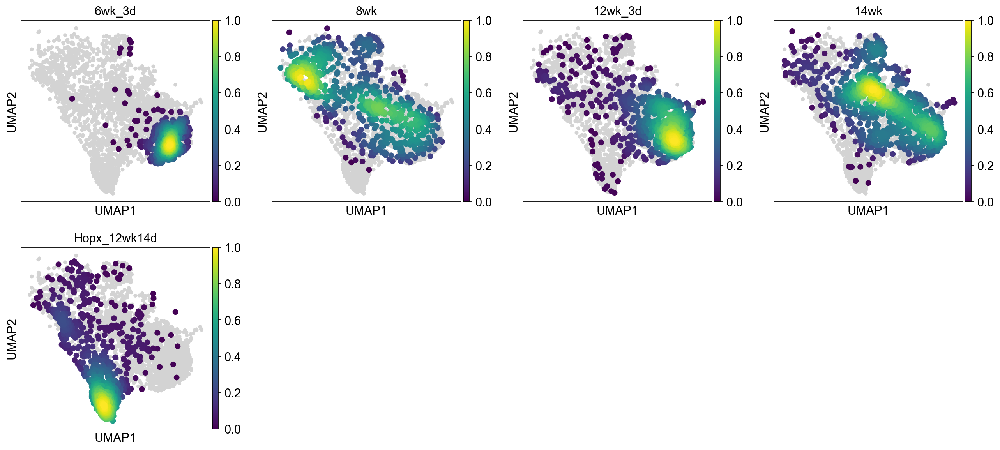

In [99]:
sc.pl.embedding_density(adata, basis='umap', key='umap_density_Group',save='Fig2_f_g_Week.svg',color_map='viridis',)

In [100]:
adata

AnnData object with n_obs × n_vars = 4096 × 29012
    obs: 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', 'EGFP_count', 'Cre_count', 'tdTomato_count', 'Sorting_Groups', 'Group', 'Akaluc_count', 'time', 'batch_subgroup', 'batch_untraced', 'Reporter', 'batch', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5', 'Cluster 6', 'Cluster 7', 'Cluster 8', 'Cluster 9', 'Cluster 10', 'Cluster 11', 'Cluster 12', 'leiden', 'umap_density_Group', 'clusterK12', 'clusterK12_stringent', 'newleiden', 'cell type', 'umap_density_Classification'
    var: 'gene_ids-Hopx-MACD', 'feature_types-Hopx-MACD', 'mt-Hopx-MACD', 'highly_variable-Hopx-MACD', 'means-Hopx-MACD', 'dispersions-Hopx-MACD', 'dispersions_norm-Hopx-MACD', 'genome-Hopx-MACD', 'pattern-Hopx-MACD', 'read-Hopx-MACD', 'sequence-Hopx-MACD', 'n_cells-Hopx-MACD', 'n_cells_by_counts-Hopx-MACD', 'mean_counts-Hopx-MACD', 'pct_dropout_by_counts-Hopx-MACD',

In [101]:
adata_t = adata[adata.obs.Group=='8wk',:].copy()

In [102]:
# Get current 'cell type' categories in the subset (in correct order)
present_categories = adata_t.obs['cell type'].cat.categories

# Get the original colors and categories
all_categories = adata.obs['cell type'].cat.categories
all_colors = adata.uns['cell type_colors']

# Map original categories to their colors
category_color_map = dict(zip(all_categories, all_colors))

# Now only keep colors for the present categories
subset_colors = [category_color_map[cat] for cat in present_categories]

# Assign them to the subset AnnData
adata_t.uns['cell type_colors'] = subset_colors

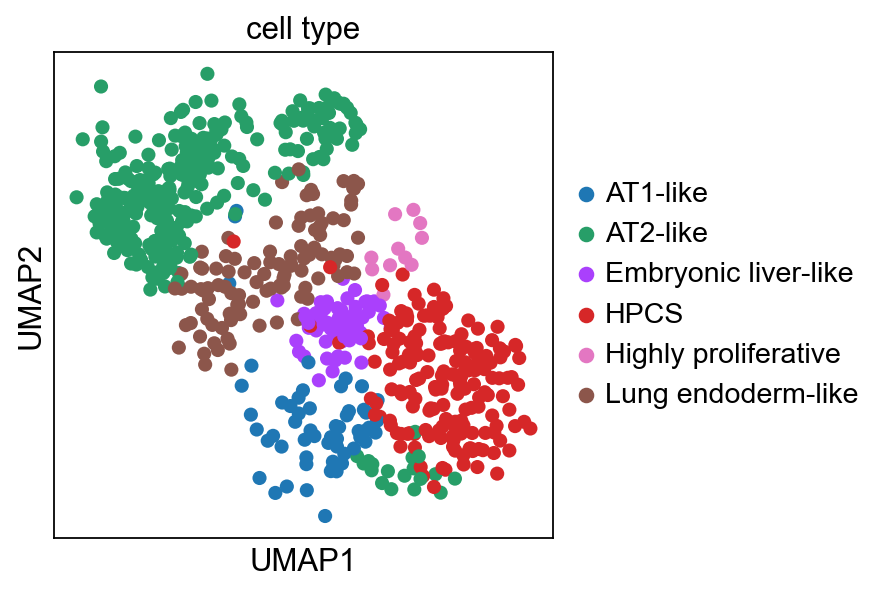

In [103]:
sc.pl.umap(adata_t,color=['cell type'], save='Fig2f_cell state umap-8wk.svg')


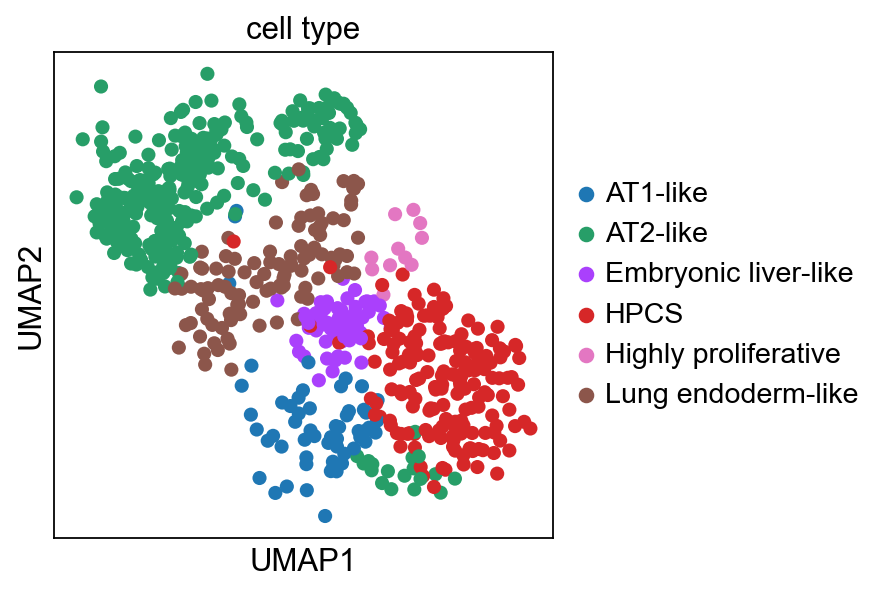

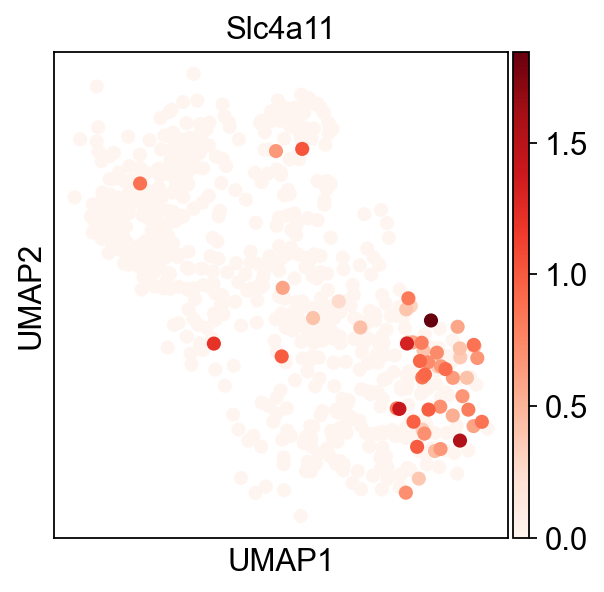

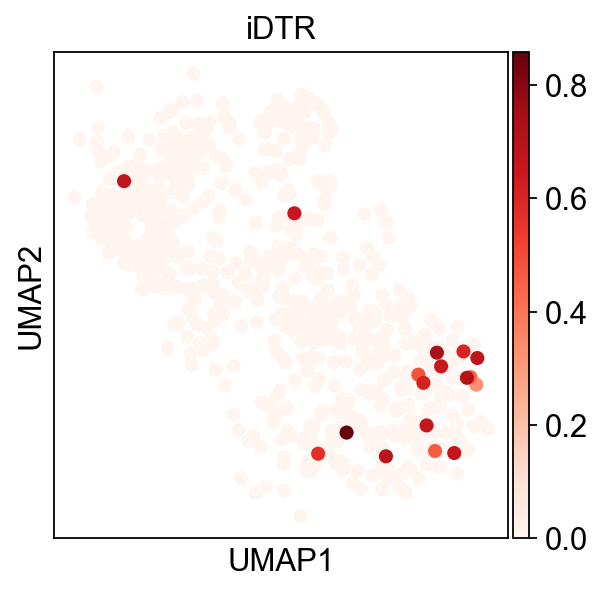

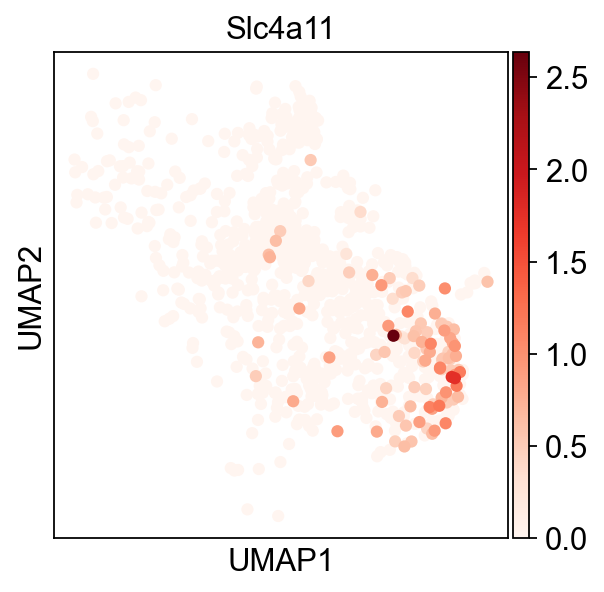

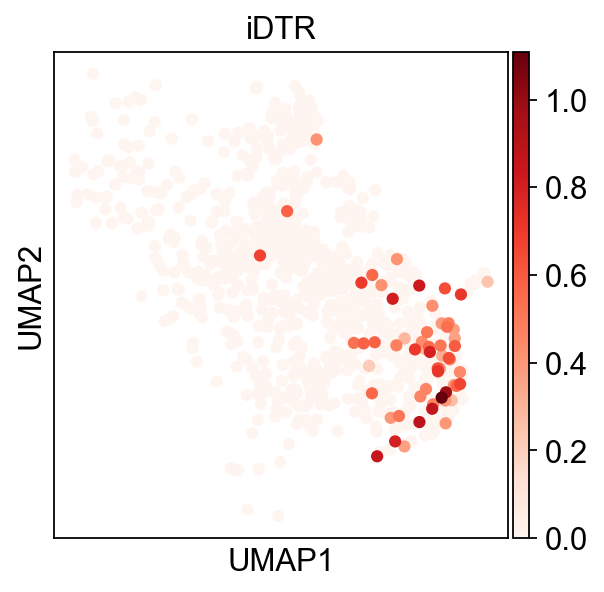

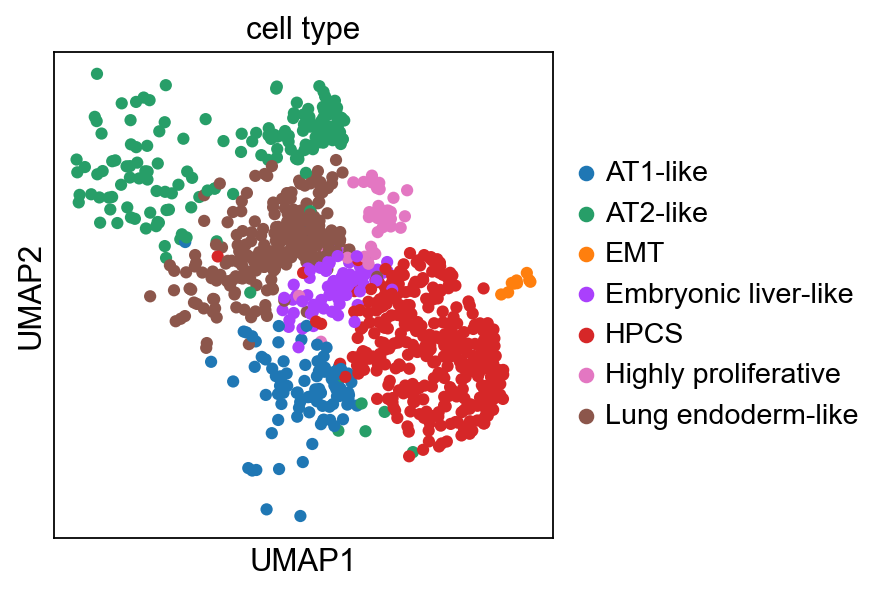

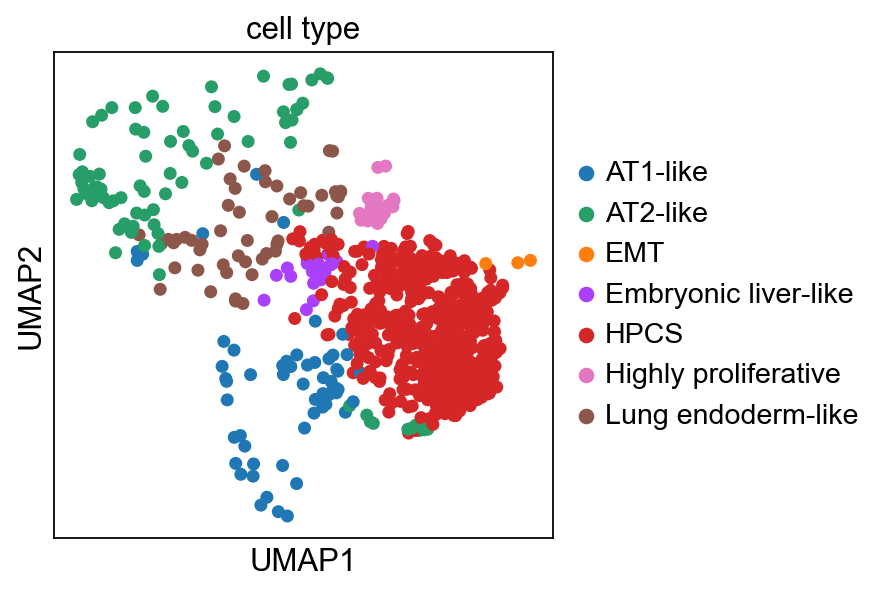

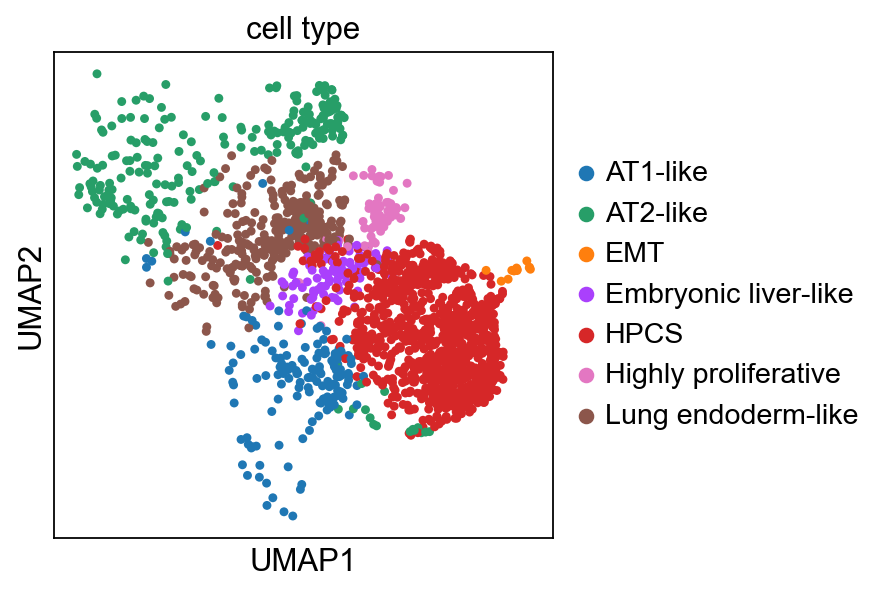

In [104]:
# will need to redo this as above to preserve colors
sc.pl.umap(adata[adata.obs.Group=='8wk',:],color=['cell type'], save='Fig2f_cell state umap-8wk.svg')
sc.pl.umap(adata[adata.obs.Group=='8wk',:],color=['Slc4a11'], save='Ext_Data_Fig5c_Slc4a11 umap-8wk.svg', cmap='Reds')
sc.pl.umap(adata[adata.obs.Group=='8wk',:],color=['iDTR'], save='Ext_Data_Fig5c_DTR umap-8wk.svg', cmap='Reds')
#sc.pl.umap(adata[adata.obs.Group=='8wk',:],color=['Cluster 5'], save='HPCS umap-8wk.svg', cmap='Reds')
sc.pl.umap(adata[adata.obs.Group=='14wk',:],color=['Slc4a11'], save='Ext_Data_Fig5d_Slc4a11 umap-14wk.svg', cmap='Reds')
sc.pl.umap(adata[adata.obs.Group=='14wk',:],color=['iDTR'], save='Ext_Data_Fig5dDTR umap-14wk.svg', cmap='Reds')
#sc.pl.umap(adata[adata.obs.Group=='14wk',:],color=['Cluster 5'], save='HPCS umap-14wk.svg', cmap='Reds')
sc.pl.umap(adata[adata.obs.Group=='14wk',:],color=['cell type'], save='Fig2g_cell state umap-14wk.svg')
sc.pl.umap(adata[adata.obs.Group=='12wk_3d',:],color=['cell type']) # save to file at somepoint
sc.pl.umap(adata[adata.obs.Group.isin(['12wk_3d','14wk']),:],color=['cell type'],save='Interim_14wk.svg')

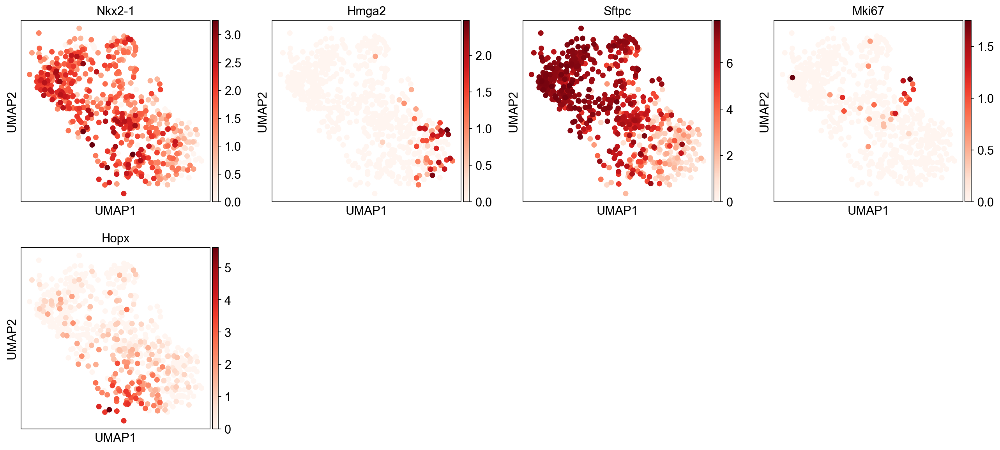

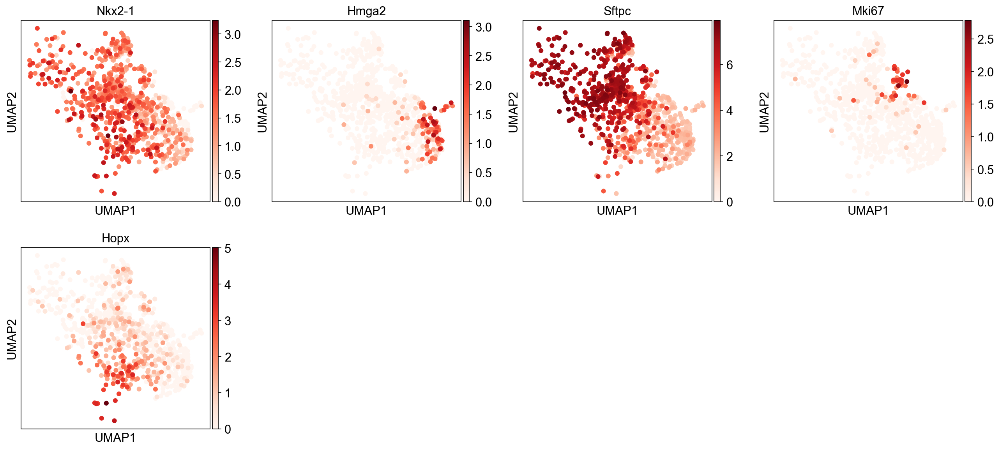

In [105]:
#Markers
sc.pl.umap(adata[adata.obs.Group=='8wk',:],color=['Nkx2-1','Hmga2','Sftpc','Mki67','Hopx'], save='Ext_Data_Fig5e_h_cell type markers-8wk.svg',cmap='Reds')
sc.pl.umap(adata[adata.obs.Group=='14wk',:],color=['Nkx2-1','Hmga2','Sftpc','Mki67','Hopx'], save='Fig2h_Ext_Data_Fig5h_cell type markers-14wk.svg',cmap='Reds')

## For Revision

In [106]:
adata_orig = anndata.read_h5ad('write/combined_data.h5ad')

In [107]:
adata2 = load('../../IGO16652_IGO16655/write/allmice-tumor-IGO16652_IGO16655-noPtprc.joblib')

KeyError: '_adata_ref'

### Try concatenation

In [ ]:
adata_orig.obs.batch.value_counts()

In [ ]:
adata_concat = adata_orig.concatenate(adata2, join="outer")

In [ ]:
sc.pp.highly_variable_genes(adata_concat, batch_key='batch')

In [ ]:
adata_concat.var.highly_variable = adata_concat.var.highly_variable_intersection

In [ ]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata_concat.var.highly_variable['EGFP'] = False
adata_concat.var.highly_variable['mScarlet'] = False
adata_concat.var.highly_variable['Cre'] = False
adata_concat.var.highly_variable['ERT'] = False
adata_concat.var.highly_variable['iDTR'] = False
adata_concat.var.highly_variable['tagBFP'] = False
adata_concat.var.highly_variable['mKate2'] = False
adata_concat.var.highly_variable['Akaluc'] = False
adata_concat.var.highly_variable['tdTomato'] = False

In [ ]:
sc.pl.highly_variable_genes(adata_concat)

In [ ]:
adata_concat.raw = adata_concat

In [ ]:
sc.pp.scale(adata_concat, max_value=10)

In [ ]:
sc.tl.pca(adata_concat, svd_solver='arpack', n_comps=150)

In [ ]:
sc.pl.pca_variance_ratio(adata_concat, log=True, n_pcs=150)

In [ ]:
sc.pp.neighbors(adata_concat, n_neighbors=15, n_pcs=50)

In [ ]:
sc.tl.umap(adata_concat)

In [ ]:
sc.pl.umap(adata_concat, color=['batch','Group'])
sc.pl.umap(adata_concat, color=['leiden','Classification',])

In [ ]:
sc.pl.umap(adata_concat, color=['Group'], groups=['Saline', 'Carrier'])

In [ ]:
sc.pl.umap(adata_concat, color=['Group'], groups=['3d','5d','10d','14wk'])
sc.pl.umap(adata_concat, color=['Group'], groups=['3d'])
sc.pl.umap(adata_concat, color=['Group'], groups=['5d'])
sc.pl.umap(adata_concat, color=['Group'], groups=['10d'])
sc.pl.umap(adata_concat, color=['Group'], groups=['14wk'])

In [108]:
sc.tl.embedding_density(adata_concat,basis='umap', groupby='Group')

NameError: name 'adata_concat' is not defined

In [109]:
sc.pl.embedding_density(adata_concat,basis='umap',key='umap_density_Group', group=['Saline','KPT','8wk','14wk','Carrier','3d','5d','10d'])

NameError: name 'adata_concat' is not defined

### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from joblib import dump, load
names = load('../common_files/genes.joblib')

In [ ]:
adata_log = adata_concat[:,adata_concat.var.index.isin(names)]

In [ ]:
adata_names = [x for x in adata_log.var.index]

In [ ]:
goi = [x for x in adata_log.var.index]

### Load SmartSeq h5ad file

In [ ]:
smartseq = anndata.read('../Marjanovic_et_al_2020/write/Marjanovic_et_al_LUAD_data.h5ad')

### Logistic Regression against Cancer Cell 2020 Clusters intersected with 10x data

In [ ]:
from sklearn.model_selection import train_test_split

names_adata = smartseq[:,smartseq.var.index.isin(goi)]

X_train, X_test, y_train, y_test = train_test_split(names_adata.X, smartseq.obs['clusterK12'], test_size=0.25, random_state=250)

In [ ]:
names = [x for x in names_adata.var.index]

In [ ]:
# import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
logreg = LogisticRegression(random_state=250,multi_class='multinomial', solver='lbfgs')

# fit the model with data
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)
y_score = logreg.predict_proba(X_test)


In [ ]:
# import the metrics class
from sklearn import metrics

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

In [ ]:
# import required modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

#Text(0.5,257.44,'Predicted label');

In [ ]:
from sklearn.metrics import classification_report
target_names = ['1', '2', '3','4','5','6','7','8','9','10','11','12']
print(classification_report(y_test, y_pred, target_names=target_names))

In [ ]:
from sklearn.preprocessing import LabelBinarizer

label_binarizer = LabelBinarizer().fit(y_train)
y_onehot_test = label_binarizer.transform(y_test)
y_onehot_test.shape  # (n_samples, n_classes)

In [ ]:
class_of_interest = '09'
class_id = np.flatnonzero(label_binarizer.classes_ == class_of_interest)[0]
class_id

In [ ]:
import matplotlib.pyplot as plt

from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_predictions(
    y_onehot_test[:, class_id],
    y_score[:, class_id],
    name=f"{class_of_interest} vs the rest",
    color="darkorange",
    #plot_chance_level=True,
)
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("One-vs-Rest ROC curves:\nVirginica vs (Setosa & Versicolor)")
plt.legend()
plt.show()

In [ ]:
y_pred = logreg.predict(smartseq[:,names].X)
y_proba = logreg.predict_proba(smartseq[:,names].X)

In [ ]:
smartseq.obs['clusterK12_intersecting'] = [x for x in y_pred]
smartseq.obs['clusterK12_intersecting'] = smartseq.obs['clusterK12_intersecting'].astype('category')

In [ ]:
results_binary = logreg.predict(X_test)
probs_binary = logreg.predict_proba(X_test)

results_df_binary = pd.DataFrame()
results_df_binary['predicted'] = list(results_binary)
#results_df_binary['actual'] = list(smartseq.obs['clusterK12'])
results_df_binary['actual'] = list(y_test)
for x in range(0,12):
    results_df_binary["probability_%d" % (x+1)] = [i[x] for i in list(probs_binary)]
results_df_binary['highest_prob'] =results_df_binary[["probability_%d" % (x+1) for x in range(0,12)]].max(axis=1)
results_df_binary['correct'] = (results_df_binary['predicted'] == results_df_binary['actual']).astype(int)
results_df_binary

In [ ]:
results_df_binary['bin'] = pd.qcut(results_df_binary['highest_prob'], q=7)
idx = pd.IntervalIndex(results_df_binary['bin'])
results_df_binary['low'] = idx.left
results_df_binary['high'] = idx.right
results_df_binary['prob range'] = results_df_binary['low'].round(2).astype(str) + "-" + results_df_binary['high'].round(2).astype(str)
df_bins_grouped = results_df_binary[['low','high','correct','prob range']].groupby('prob range').mean().reset_index()
df_bins_grouped

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(4,4))
plt.subplots_adjust(top=0.85)

ax = sns.barplot(x='prob range', y='correct', data=df_bins_grouped)
plt.title("Logistic Regression Accuracy by Probability Range")
plt.ylabel('Percent correct')
plt.xlabel('Probability range')
plt.show()

In [ ]:
#reset size
from matplotlib import rcParams
FIGSIZE=(4,4)
rcParams['figure.figsize']=FIGSIZE

In [ ]:
sc.pl.umap(smartseq, color=['clusterK12','clusterK12_intersecting'])

In [ ]:
dict = {1: "01", 2: "02", 3: "03", 4: "04", 5: "05", 6: "06", 7: "07", 8: "08", 9: "09", 10: "10", 11: "11", 12: "12"}

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(smartseq.obs.replace({"clusterK12": dict})['clusterK12'], smartseq.obs['clusterK12_intersecting'])

In [ ]:
results_binary = logreg.predict(smartseq[:,names].X)
probs_binary = logreg.predict_proba(smartseq[:,names].X)

results_df_binary = pd.DataFrame()
results_df_binary['predicted'] = list(results_binary)

for x in range(0,12):
    results_df_binary[x+1] = [i[x] for i in list(probs_binary)]
results_df_binary['highest_prob'] =results_df_binary[[x+1 for x in range(0,12)]].max(axis=1)
results_df_binary

In [ ]:
_ = plt.hist(results_df_binary['highest_prob'], bins='auto', histtype='step')

### End LogisticRegression

In [ ]:
adata_ordered_genes = [adata_names.index(x) for x in names]

In [ ]:
adata_log_ordered = adata_log[:,adata_ordered_genes]

In [ ]:
y_pred = logreg.predict(adata_log_ordered.X)

In [ ]:
adata_log_ordered.obs['clusterK12'] = [x for x in y_pred]
adata_log_ordered.obs['clusterK12'] = adata_log_ordered.obs['clusterK12'].astype('category')

In [ ]:
#reset size
from matplotlib import rcParams
FIGSIZE=(4,4)
rcParams['figure.figsize']=FIGSIZE

In [ ]:
sc.pl.umap(adata_log_ordered,color=['leiden','clusterK12'], wspace=0.1)

In [ ]:
sc.pl.umap(adata_log_ordered,color=['clusterK12'])

In [ ]:
for x in adata_log_ordered.obs.clusterK12.cat.categories:
    sc.pl.umap(adata_log_ordered,color=['clusterK12'], groups=[x])

In [ ]:
 cell_proportion_df = adata_log_ordered.obs.leiden.value_counts().T.plot(kind='bar', stacked=True, legend=False)

In [ ]:
 cell_proportion_df = adata_log_ordered.obs.clusterK12.value_counts(sort=False).T.plot(kind='bar', stacked=True, legend=False)

In [ ]:
 cell_proportion_df = pd.crosstab(adata_log_ordered.obs['leiden'],adata_log_ordered.obs['clusterK12'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [ ]:
 cell_proportion_df = pd.crosstab(adata_log_ordered.obs['leiden'],adata_log_ordered.obs['clusterK12'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [ ]:
results_binary = logreg.predict(adata_log_ordered.X)
probs_binary = logreg.predict_proba(adata_log_ordered.X)

results_df_binary = pd.DataFrame()
results_df_binary['predicted'] = list(results_binary)
#results_df_binary['actual'] = list(smartseq.obs['clusterK12'])
for x in range(0,12):
    results_df_binary[x+1] = [i[x] for i in list(probs_binary)]
results_df_binary['highest_prob'] =results_df_binary[[x+1 for x in range(0,12)]].max(axis=1)
results_df_binary

In [ ]:
_ = plt.hist(results_df_binary['highest_prob'], bins='auto')
plt.axvline(x=0.9)

In [ ]:
results_df_binary['bin'] = pd.qcut(results_df_binary['highest_prob'], q=7)
idx = pd.IntervalIndex(results_df_binary['bin'])
results_df_binary['low'] = idx.left
results_df_binary['high'] = idx.right
results_df_binary['prob range'] = results_df_binary['low'].round(2).astype(str) + "-" + results_df_binary['high'].round(2).astype(str)
df_bins_grouped = results_df_binary[['low','high','prob range']].groupby('prob range').mean().reset_index()
df_bins_grouped

In [ ]:
cutoff = 0.8
adata_log_ordered.obs['clusterK12_stringent'] = 'other'
adata_log_ordered.obs['clusterK12_stringent'][np.array(results_df_binary['highest_prob'] >= cutoff)] = ["%02d" % y for y in results_df_binary[[x+1 for x in range(0,12)]].idxmax(axis=1)[np.array(results_df_binary['highest_prob'] >= cutoff)].to_numpy()]

In [ ]:
adata_log_ordered.obs['clusterK12_stringent']

In [ ]:
adata_log_ordered.obs['clusterK12_stringent'] = adata_log_ordered.obs['clusterK12_stringent'].astype('category')

In [ ]:
sc.pl.umap(adata_log_ordered, color=['clusterK12', 'clusterK12_stringent'], wspace=0.5)

In [ ]:
 cell_proportion_df = pd.crosstab(adata_log_ordered.obs['clusterK12_stringent'],adata_log_ordered.obs['clusterK12'],normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [ ]:
 cell_proportion_df = pd.crosstab(adata_log_ordered.obs['leiden'],adata_log_ordered.obs['clusterK12_stringent'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [ ]:
 cell_proportion_df = pd.crosstab(adata_log_ordered.obs['Group'],adata_log_ordered.obs['clusterK12_stringent'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [ ]:
cancerCell = ['Cluster 1', 'Cluster 2','Cluster 3','Cluster 4','Cluster 5','Cluster 6', 'Cluster 7', 
              'Cluster 8', 'Cluster 9', 'Cluster 10', 'Cluster 11', 'Cluster 12']
#cell_proportion_df = pd.crosstab(adata_log_ordered.obs['Cluster 1'],adata_log_ordered.obs['clusterK12']).T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))
sc.pl.matrixplot(adata_log_ordered, cancerCell, 'clusterK12', standard_scale='var')
sc.pl.matrixplot(adata_log_ordered, cancerCell, 'clusterK12_stringent', standard_scale='var')

In [ ]:
for x in adata_log_ordered.obs.clusterK12_stringent.cat.categories:
    # skip if NA
    sc.pl.umap(adata_log_ordered, color='clusterK12_stringent', groups=[x])

In [ ]:
cancerCell = ['Cluster 1', 'Cluster 2','Cluster 3','Cluster 4','Cluster 5','Cluster 6', 'Cluster 7', 
              'Cluster 8', 'Cluster 9', 'Cluster 10', 'Cluster 11', 'Cluster 12']

In [ ]:
sc.pl.stacked_violin(adata_log_ordered, cancerCell, groupby='clusterK12_stringent')

In [ ]:
sc.pl.dotplot(adata_log_ordered, [*cancerCell], groupby='clusterK12_stringent')
sc.pl.dotplot(adata_log_ordered, [*cancerCell], groupby='Group')

In [ ]:
sc.pl.matrixplot(adata_log_ordered, [*cancerCell], groupby='Group',standard_scale='var')
#sc.pl.matrixplot(adata_log_ordered, cancerCell, groupby='Group',standard_scale='var')

In [ ]:
adata_concat.obs['clusterK12'] = adata_log_ordered.obs['clusterK12'].astype('category')
adata_concat.obs['clusterK12_stringent'] = adata_log_ordered.obs['clusterK12_stringent'].astype('category')

In [ ]:
 cell_proportion_df = pd.crosstab(adata_concat.obs['leiden'],adata_log_ordered.obs['clusterK12_stringent'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [ ]:
 cell_proportion_df = pd.crosstab(adata_concat.obs['clusterK12'],adata_log_ordered.obs['leiden'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [ ]:
 cell_proportion_df = pd.crosstab(adata_concat.obs['clusterK12'],adata_log_ordered.obs['Group'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [ ]:
sc.pl.umap(adata_concat, color=['clusterK12', 'clusterK12_stringent','leiden'], wspace=0.3)

### End Logistic Regression

In [ ]:
sc.tl.embedding_density(adata_concat,basis='umap', groupby='clusterK12')

In [ ]:
sc.pl.embedding_density(adata_concat,basis='umap',key='umap_density_clusterK12')

### Try ingestion

In [ ]:
var_names = adata_orig.var_names.intersection(adata2.var_names)
adata_ref = adata_orig[:, var_names]
adata3 = adata2[:, var_names]

In [ ]:
sc.pp.highly_variable_genes(adata_ref, batch_key='batch')

In [ ]:
adata_ref.var.highly_variable = adata_ref.var.highly_variable_intersection

In [ ]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata_ref.var.highly_variable['EGFP'] = False
adata_ref.var.highly_variable['mScarlet'] = False
adata_ref.var.highly_variable['Cre'] = False
adata_ref.var.highly_variable['ERT'] = False
adata_ref.var.highly_variable['iDTR'] = False
adata_ref.var.highly_variable['tagBFP'] = False
adata_ref.var.highly_variable['mKate2'] = False
adata_ref.var.highly_variable['Akaluc'] = False
adata_ref.var.highly_variable['tdTomato'] = False

In [ ]:
sc.pl.highly_variable_genes(adata_ref)

In [ ]:
adata_ref.raw = adata_ref

In [ ]:
sc.pp.scale(adata_ref, max_value=10)

In [ ]:
sc.tl.pca(adata_ref, svd_solver='arpack', n_comps=150)

In [ ]:
sc.pl.pca_variance_ratio(adata_ref, log=True, n_pcs=150)

In [ ]:
sc.pp.neighbors(adata_ref, n_neighbors=15, n_pcs=50)

In [ ]:
sc.tl.umap(adata_ref)

In [ ]:
sc.pl.umap(adata_ref, color="leiden")

In [ ]:
sc.tl.ingest(adata3, adata_ref, obs="leiden")

In [ ]:
adata3.uns["leiden_colors"] = adata_ref.uns["leiden_colors"]

In [ ]:
adata_concat = adata_ref.concatenate(adata3, batch_categories=["old", "new"])

In [ ]:
adata_concat.obs.leiden = adata_concat.obs.leiden.astype("category")
# fix category ordering
adata_concat.obs.leiden = adata_concat.obs.leiden.cat.reorder_categories(adata_ref.obs.leiden.cat.categories)
# fix category colors
adata_concat.uns["leiden_colors"] = adata_ref.uns["leiden_colors"]

In [ ]:
sc.pl.umap(adata_concat, color=["batch", "leiden"])

In [ ]:
sc.pl.umap(adata_concat, color=['batch','Group','Classification','leiden'])

In [ ]:
sc.pl.umap(adata_concat, color=['Group'], groups=['Saline', 'Carrier'])

In [ ]:
sc.pl.umap(adata_concat, color=['Group'], groups=['3d','5d','10d','14wk'])
sc.pl.umap(adata_concat, color=['Group'], groups=['3d'])
sc.pl.umap(adata_concat, color=['Group'], groups=['5d'])
sc.pl.umap(adata_concat, color=['Group'], groups=['10d'])
sc.pl.umap(adata_concat, color=['Group'], groups=['14wk'])

In [ ]:
sc.tl.embedding_density(adata_concat,basis='umap', groupby='Group')

In [ ]:
sc.pl.embedding_density(adata_concat,basis='umap',key='umap_density_Group')

In [ ]:
adata.obs.batch.value_counts()